In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf


In [123]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping

In [13]:
df = pd.read_csv('alzheimers_disease_data.csv')

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [16]:
df.shape


(2149, 35)

In [52]:
df.drop(['PatientID', 'DoctorInCharge'], axis=1, inplace=True)

In [53]:
df.describe()

,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,SleepQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
count,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,...,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000
mean,74.908795,0.506282,0.697534,1.286645,27.655697,0.288506,10.039442,4.920202,4.993138,7.051081,...,5.080055,0.208004,0.156817,4.982958,0.205212,0.158213,0.150768,0.158678,0.301536,0.353653
std,8.990221,0.500077,0.996128,0.904527,7.217438,0.453173,5.757910,2.857191,2.909055,1.763573,...,2.892743,0.405974,0.363713,2.949775,0.403950,0.365026,0.357906,0.365461,0.459032,0.478214
min,60.000000,0.000000,0.000000,0.000000,15.008851,0.000000,0.002003,0.003616,0.009385,4.002629,...,0.000460,0.000000,0.000000,0.001288,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,67.000000,0.000000,0.000000,1.000000,21.611408,0.000000,5.139810,2.570626,2.458455,5.482997,...,2.566281,0.000000,0.000000,2.342836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,75.000000,1.000000,0.000000,1.000000,27.823924,0.000000,9.934412,4.766424,5.076087,7.115646,...,5.094439,0.000000,0.000000,5.038973,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,83.000000,1.000000,1.000000,2.000000,33.869778,1.000000,15.157931,7.427899,7.558625,8.562521,...,7.546981,0.000000,0.000000,7.581490,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,90.000000,1.000000,3.000000,3.000000,39.992767,1.000000,19.989293,9.987429,9.998346,9.999840,...,9.996467,1.000000,1.000000,9.999747,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


<function matplotlib.pyplot.show(close=None, block=None)>

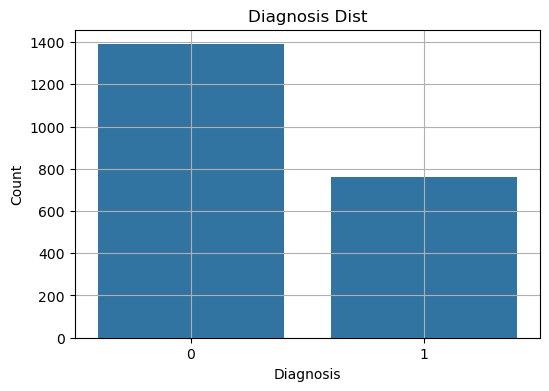

In [54]:
plt.figure(figsize=(6,4))
sns.countplot(x='Diagnosis', data=df)
plt.title('Diagnosis Dist')
plt.xlabel('Diagnosis')
plt.ylabel('Count')
plt.grid(True)
plt.show

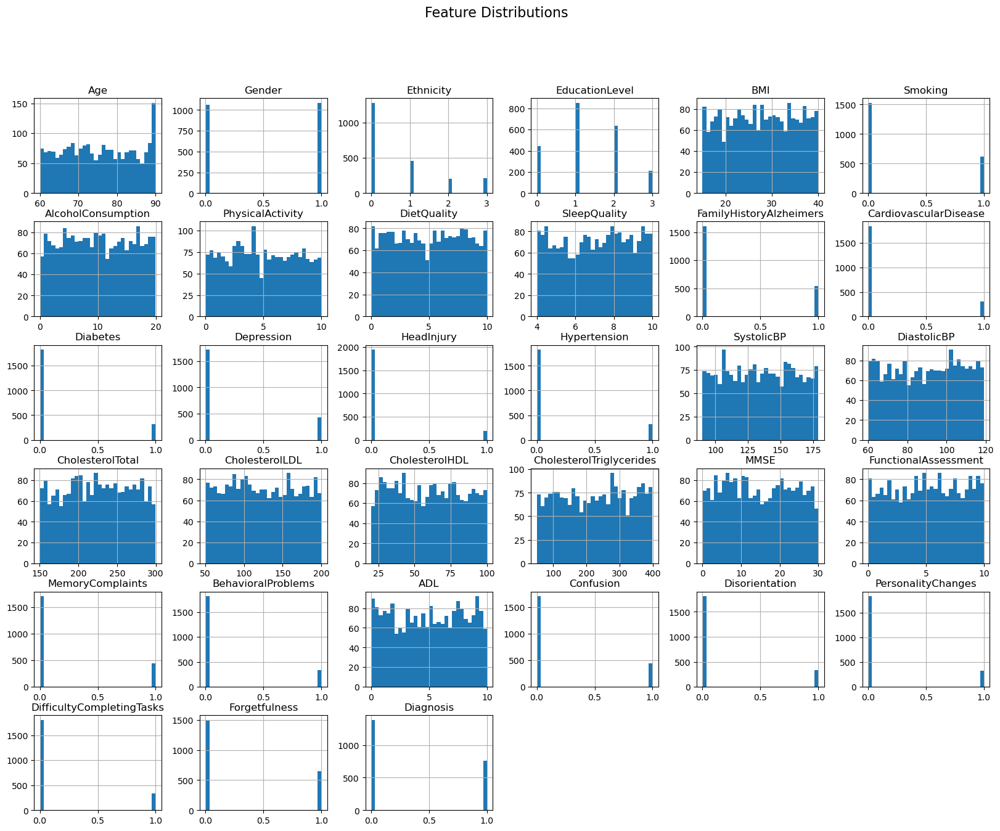

In [56]:
df.hist(bins=30, figsize=(20, 15))
plt.suptitle('Feature Distributions', fontsize=16)
plt.show()

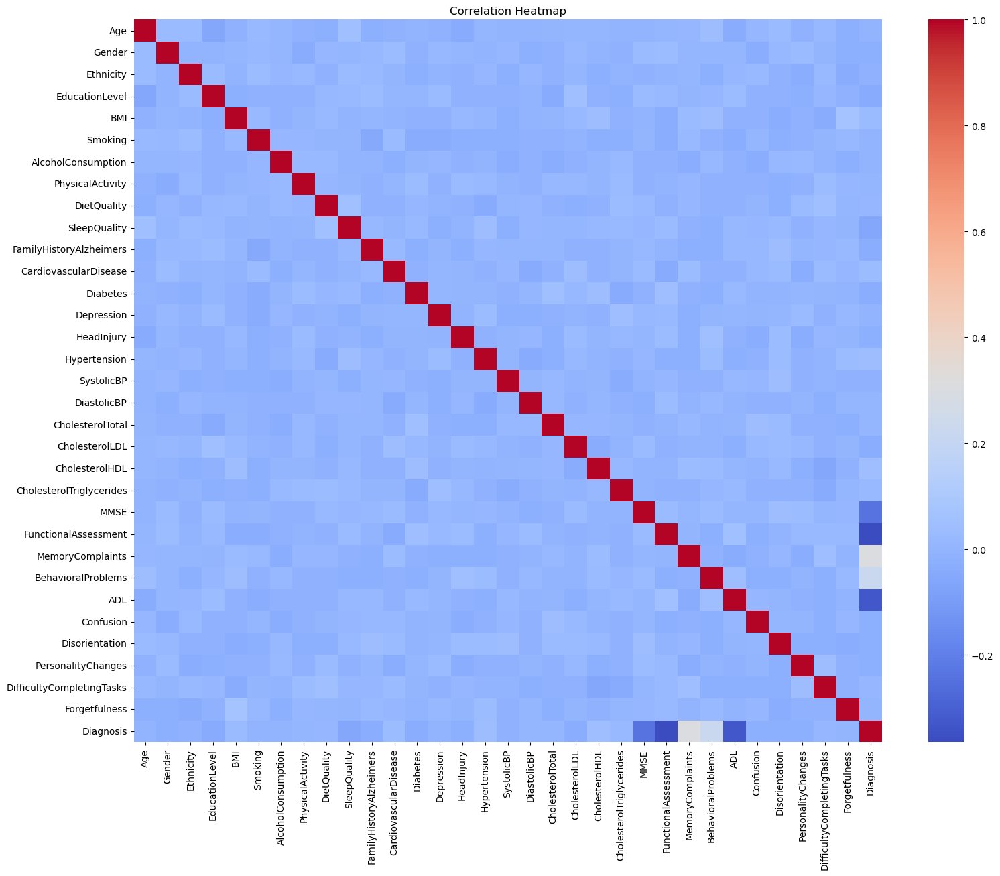

In [57]:
plt.figure(figsize=(18, 14))
corr = df_cleaned.corr()
sns.heatmap(corr, annot=False, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap")
plt.show()

In [58]:
target_corr = corr['Diagnosis'].drop('Diagnosis').sort_values(ascending=False)

target_corr.head(10)

MemoryComplaints             0.306742
BehavioralProblems           0.224350
CholesterolHDL               0.042584
Hypertension                 0.035080
CardiovascularDisease        0.031490
BMI                          0.026343
CholesterolTriglycerides     0.022672
DifficultyCompletingTasks    0.009069
DietQuality                  0.008506
CholesterolTotal             0.006394
Name: Diagnosis, dtype: float64

In [59]:
target_corr.tail(10)

HeadInjury                -0.021411
Disorientation            -0.024648
Diabetes                  -0.031508
CholesterolLDL            -0.031976
FamilyHistoryAlzheimers   -0.032900
EducationLevel            -0.043966
SleepQuality              -0.056548
MMSE                      -0.237126
ADL                       -0.332346
FunctionalAssessment      -0.364898
Name: Diagnosis, dtype: float64

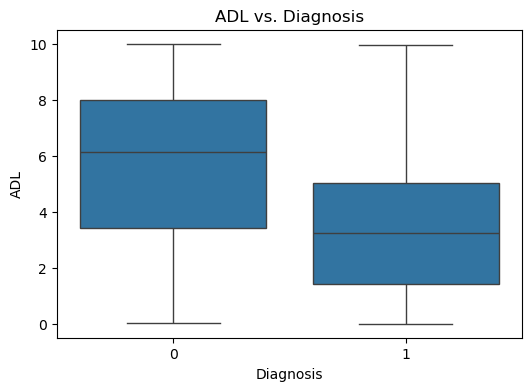

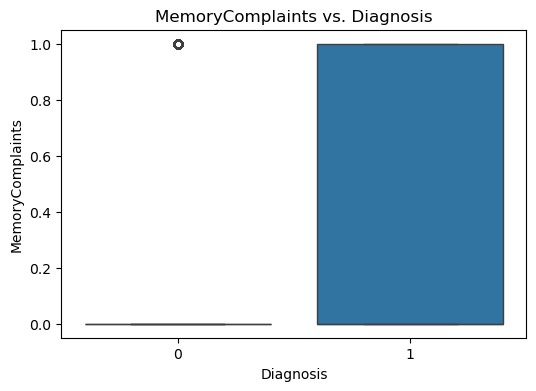

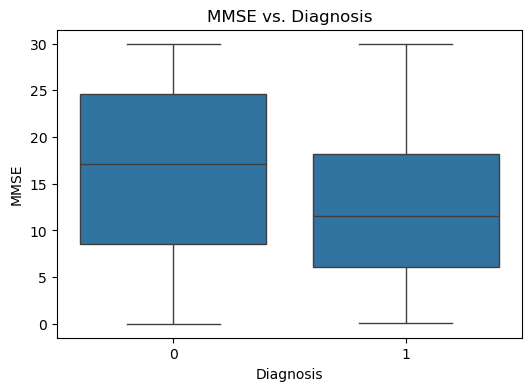

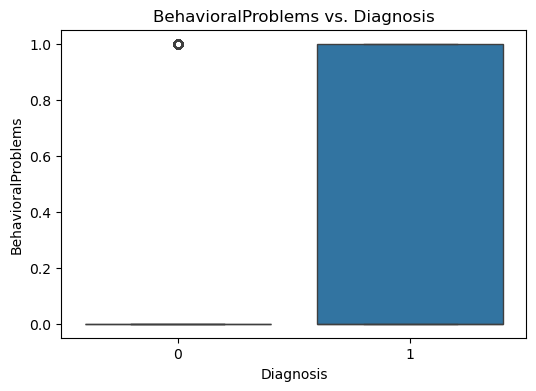

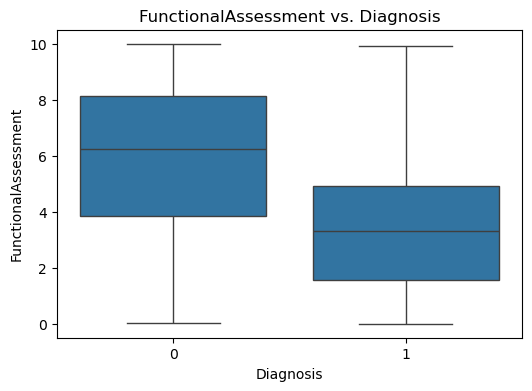

In [60]:
important_features = ['ADL', 'MemoryComplaints', 'MMSE', 'BehavioralProblems', 'FunctionalAssessment']
for feature in important_features:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df, x='Diagnosis', y=feature)
    plt.title(f"{feature} vs. Diagnosis")
    plt.show()

In [61]:
df.columns

Index(['Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI', 'Smoking',
       'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality',
       'FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes',
       'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP', 'DiastolicBP',
       'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
       'MemoryComplaints', 'BehavioralProblems', 'ADL', 'Confusion',
       'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks',
       'Forgetfulness', 'Diagnosis'],
      dtype='object')

In [62]:
target = 'Diagnosis'

binary_features = [
    'Gender', 'Smoking', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
    'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'MemoryComplaints',
    'BehavioralProblems', 'Confusion', 'Disorientation', 'PersonalityChanges',
    'DifficultyCompletingTasks', 'Forgetfulness'
]

categorical_features = ['Ethnicity']  # Nominal (needs one-hot)

ordinal_features = ['EducationLevel', 'DietQuality', 'SleepQuality', 'FunctionalAssessment', 'ADL']

numerical_features = [
    'Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'SystolicBP', 'DiastolicBP',
    'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides',
    'MMSE'
]

In [63]:
X = df.drop(columns=[target])
y = df[target]


In [64]:
numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder(drop='first')

In [65]:
preprocessor = ColumnTransformer(transformers=[
    ('num', numeric_transformer, numerical_features + ordinal_features),
    ('cat', categorical_transformer, categorical_features)
], remainder='passthrough') 

In [66]:
X_processed = preprocessor.fit_transform(X)

In [67]:
X_train, X_test, y_train, y_test = train_test_split(
    X_processed, y, test_size=0.2, stratify=y, random_state=42
)

In [68]:
X_train.shape


(1719, 34)

In [69]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [70]:
for fold, (train_idx, val_idx) in enumerate(skf.split(X_processed, y)):
    print(f"📂 Fold {fold+1}")
    print(f"Train samples: {len(train_idx)} | Val samples: {len(val_idx)}")
    print(f"Train Alzheimer rate: {y.iloc[train_idx].mean():.2f}")
    print(f"Val Alzheimer rate: {y.iloc[val_idx].mean():.2f}")
    print("-" * 30)

📂 Fold 1
Train samples: 1719 | Val samples: 430
Train Alzheimer rate: 0.35
Val Alzheimer rate: 0.35
------------------------------
📂 Fold 2
Train samples: 1719 | Val samples: 430
Train Alzheimer rate: 0.35
Val Alzheimer rate: 0.35
------------------------------
📂 Fold 3
Train samples: 1719 | Val samples: 430
Train Alzheimer rate: 0.35
Val Alzheimer rate: 0.35
------------------------------
📂 Fold 4
Train samples: 1719 | Val samples: 430
Train Alzheimer rate: 0.35
Val Alzheimer rate: 0.35
------------------------------
📂 Fold 5
Train samples: 1720 | Val samples: 429
Train Alzheimer rate: 0.35
Val Alzheimer rate: 0.35
------------------------------


In [71]:
def plot_training_history(history, fold):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Val')
    plt.title(f'Fold {fold} - CE Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Val')
    plt.title(f'Fold {fold} - Accuracy')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history.history['mean_squared_error'], label='Train')
    plt.plot(history.history['val_mean_squared_error'], label='Val')
    plt.title(f'Fold {fold} - MSE')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [72]:
def build_model(input_dim, hidden_dim, activation='tanh', output_activation='sigmoid'):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(hidden_dim, activation=activation),
        layers.Dense(1, activation=output_activation)
    ])

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=0.001),
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.MeanSquaredError()]
    )
    return model

In [89]:
def run_5fold_cv(X, y, hidden_dim, activation='tanh', epochs=100, batch_size=32):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\n🔁 Fold {fold+1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = build_model(input_dim=X.shape[1], hidden_dim=hidden_dim, activation=activation)

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=0,
            callbacks=[early_stopping]
        )

        scores = model.evaluate(X_val, y_val, verbose=0)
        metrics_dict = {
            'Fold': fold+1,
            'CE_Loss': scores[0],
            'Accuracy': scores[1],
            'MSE': scores[2]
        }
        fold_metrics.append(metrics_dict)
        print(f"✅ CE Loss: {scores[0]:.4f} | Acc: {scores[1]:.4f} | MSE: {scores[2]:.4f}")

        plot_training_history(history, fold+1)

    return pd.DataFrame(fold_metrics)


In [74]:
X_processed

array([[-0.21236841, -0.65522531,  0.56592307, ...,  0.        ,
         1.        ,  0.        ],
       [ 1.56775727, -0.11475103, -0.95489457, ...,  0.        ,
         0.        ,  1.        ],
       [-0.21236841, -1.36642797,  1.65300553, ...,  0.        ,
         1.        ,  0.        ],
       ...,
       [ 0.23266301, -1.68786382, -0.94583599, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.34392086, -1.71233356, -0.23710932, ...,  0.        ,
         0.        ,  1.        ],
       [-0.32362627,  0.78079682, -0.37326713, ...,  0.        ,
         0.        ,  1.        ]])

In [75]:
X = np.array(X_processed)
y = np.array(y)


🔁 Fold 1
✅ CE Loss: 0.4003 | Acc: 0.8442 | MSE: 0.1193


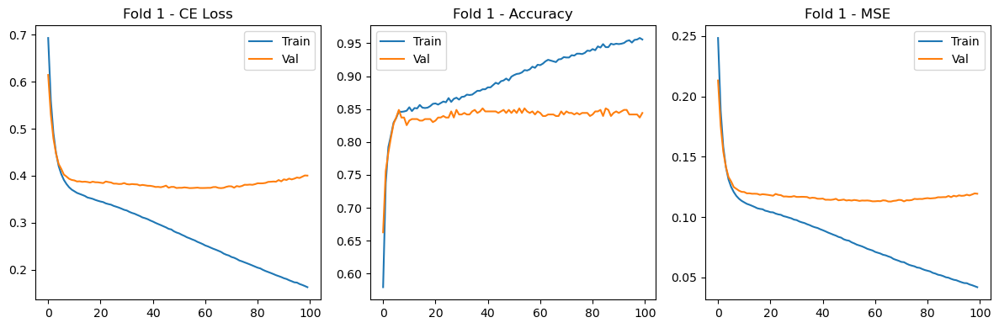


🔁 Fold 2
✅ CE Loss: 0.3533 | Acc: 0.8349 | MSE: 0.1087


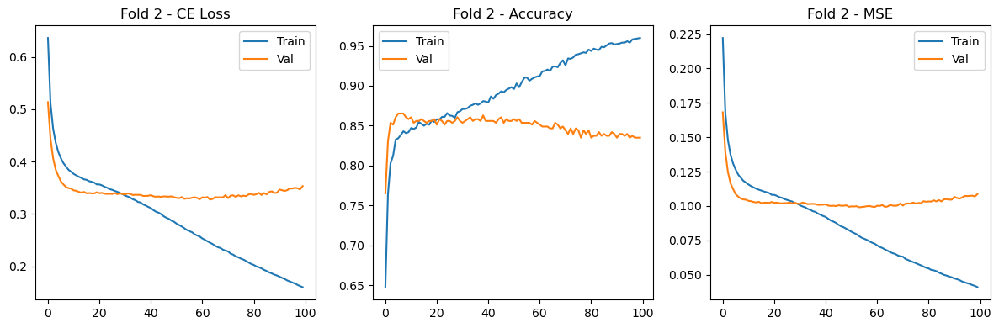


🔁 Fold 3
✅ CE Loss: 0.4504 | Acc: 0.8233 | MSE: 0.1283


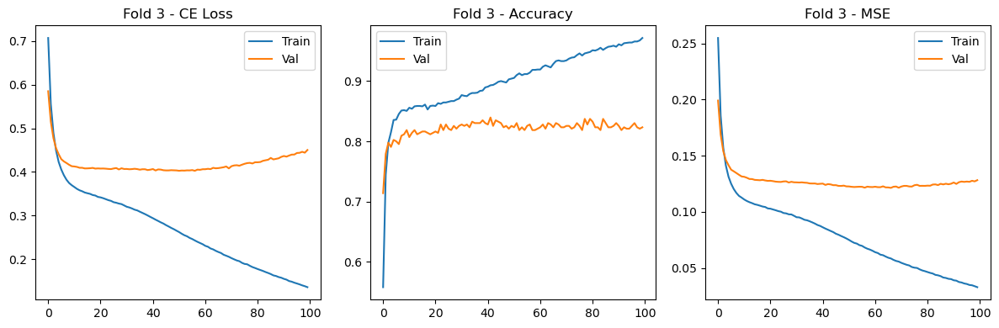


🔁 Fold 4
✅ CE Loss: 0.4134 | Acc: 0.8279 | MSE: 0.1205


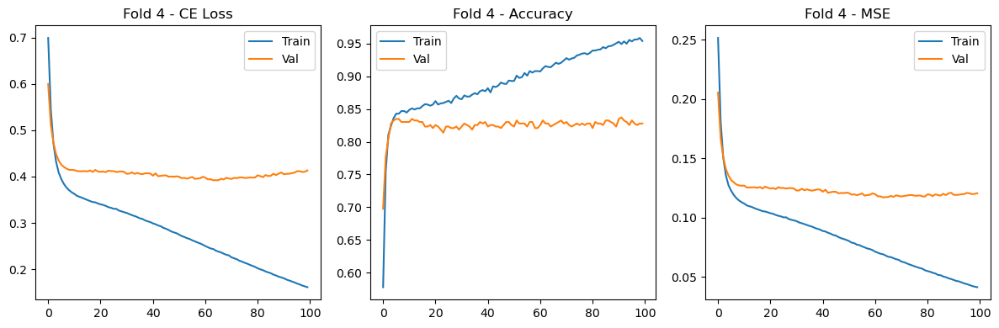


🔁 Fold 5
✅ CE Loss: 0.3930 | Acc: 0.8275 | MSE: 0.1185


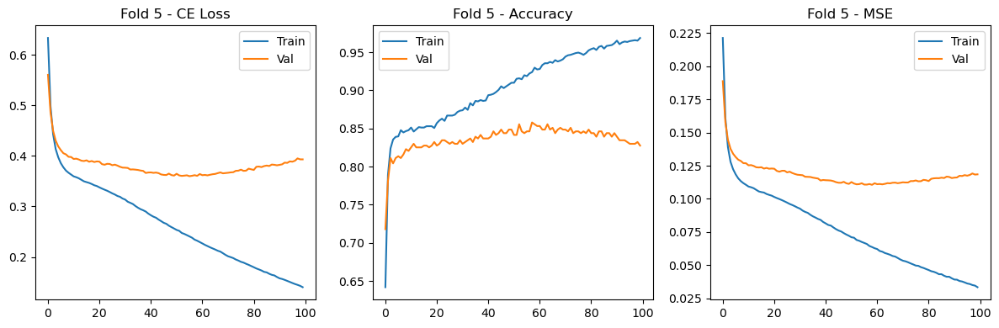

In [77]:
hidden_dim = X.shape[1]
metrics = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation='tanh', epochs=100)


🔁 Fold 1
✅ CE Loss: 0.4242 | Acc: 0.8512 | MSE: 0.1197


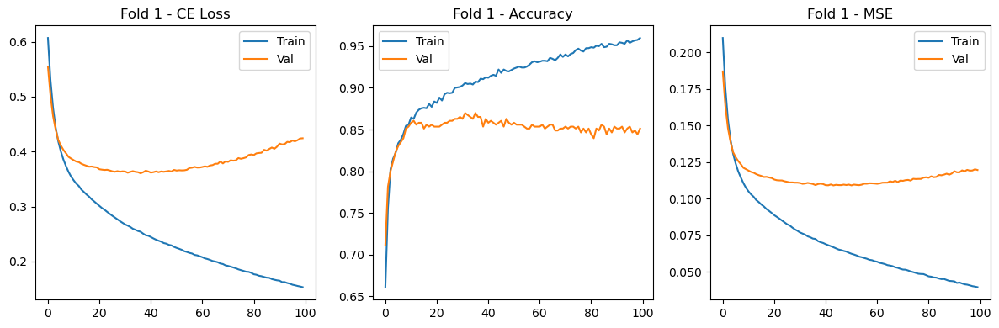


🔁 Fold 2
✅ CE Loss: 0.4132 | Acc: 0.8512 | MSE: 0.1129


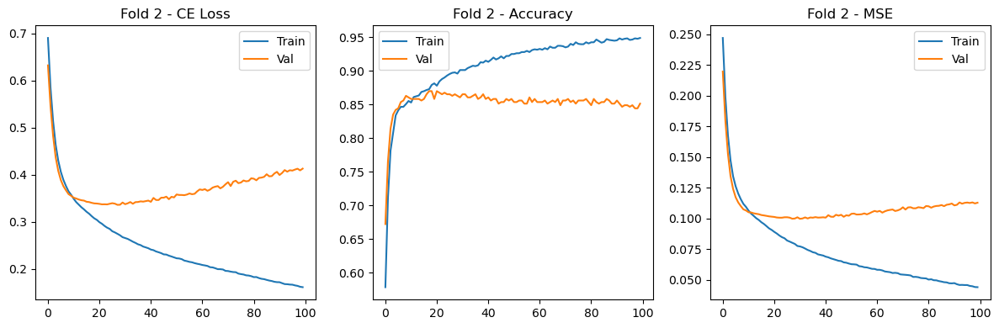


🔁 Fold 3
✅ CE Loss: 0.4930 | Acc: 0.8256 | MSE: 0.1332


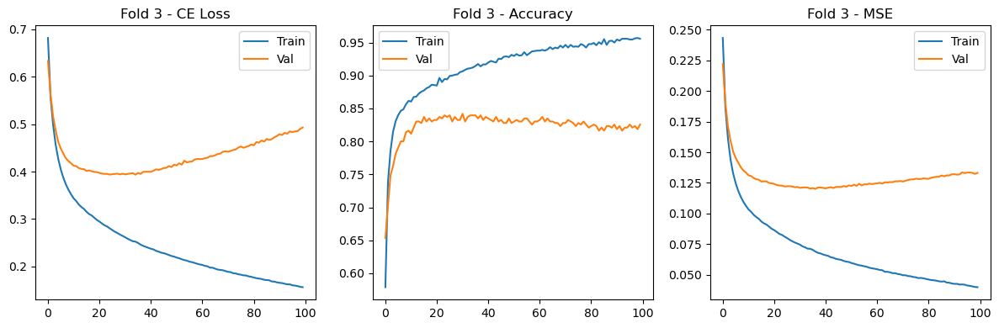


🔁 Fold 4
✅ CE Loss: 0.4151 | Acc: 0.8512 | MSE: 0.1118


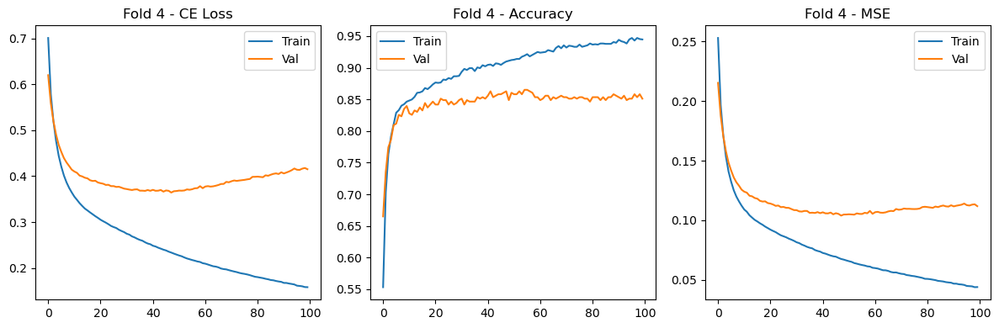


🔁 Fold 5
✅ CE Loss: 0.5073 | Acc: 0.8252 | MSE: 0.1336


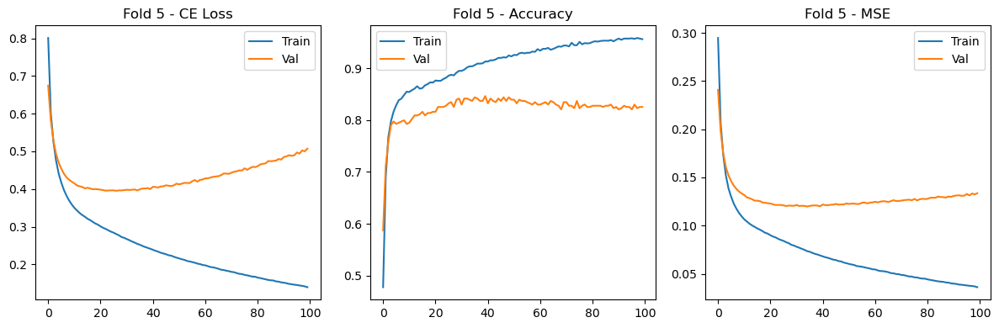

In [78]:
metrics = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation='relu', epochs=100)


🔁 Fold 1
✅ CE Loss: 0.3974 | Acc: 0.8419 | MSE: 0.1161


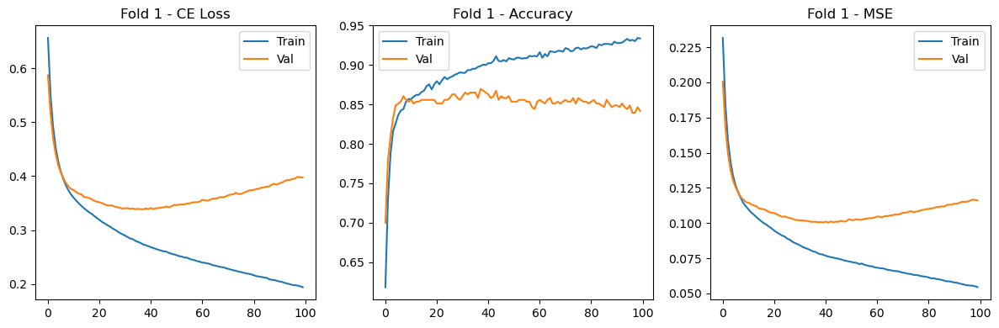


🔁 Fold 2
✅ CE Loss: 0.4497 | Acc: 0.8419 | MSE: 0.1213


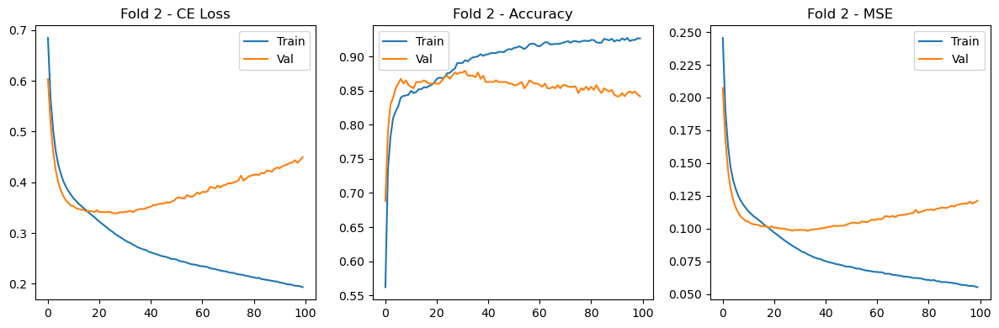


🔁 Fold 3
✅ CE Loss: 0.5153 | Acc: 0.8163 | MSE: 0.1370


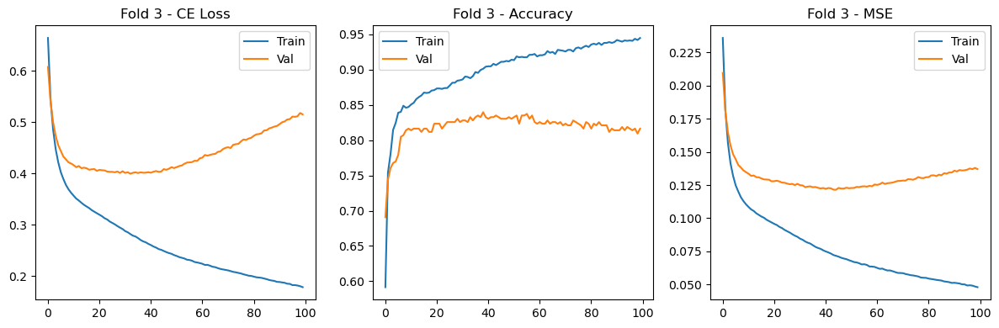


🔁 Fold 4
✅ CE Loss: 0.4513 | Acc: 0.8442 | MSE: 0.1203


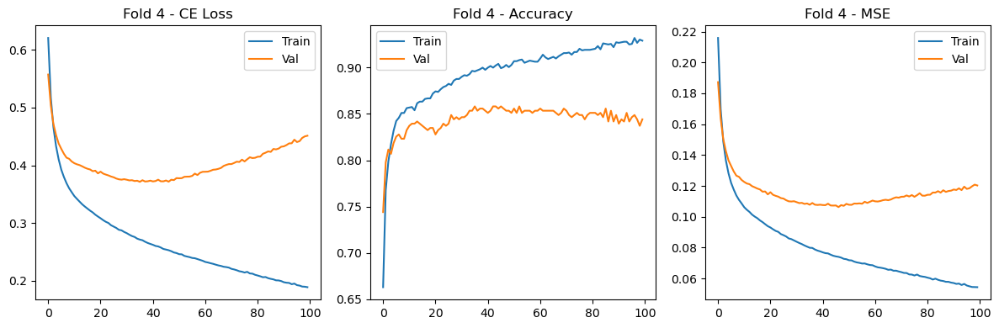


🔁 Fold 5
✅ CE Loss: 0.4698 | Acc: 0.8228 | MSE: 0.1298


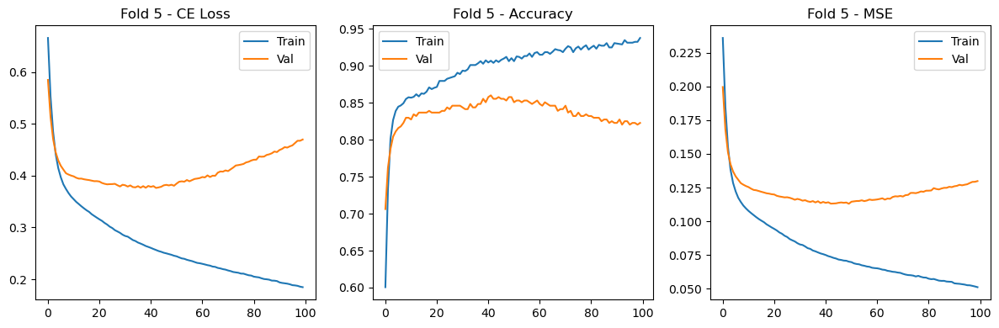

In [81]:
metrics = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation=tf.nn.silu, epochs=100)

In [82]:
input_dim = X.shape[1]

hidden_sizes = {
    'I/2': input_dim // 2,
    '2I/3': (2 * input_dim) // 3,
    'I': input_dim,
    '2I': 2 * input_dim
}


🔧 Running model with hidden size I/2 (17 neurons)

🔁 Fold 1
✅ CE Loss: 0.3653 | Acc: 0.8605 | MSE: 0.1071


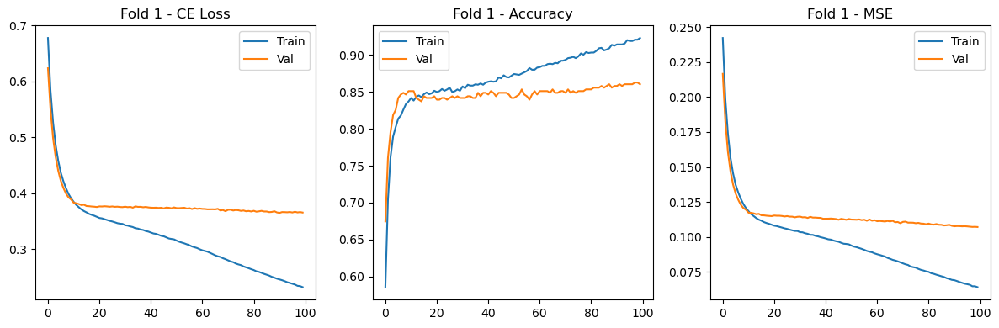


🔁 Fold 2
✅ CE Loss: 0.3328 | Acc: 0.8558 | MSE: 0.1018


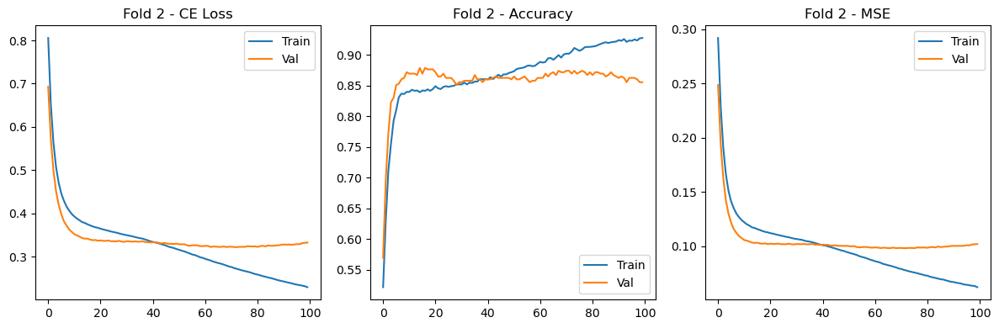


🔁 Fold 3
✅ CE Loss: 0.4338 | Acc: 0.8116 | MSE: 0.1312


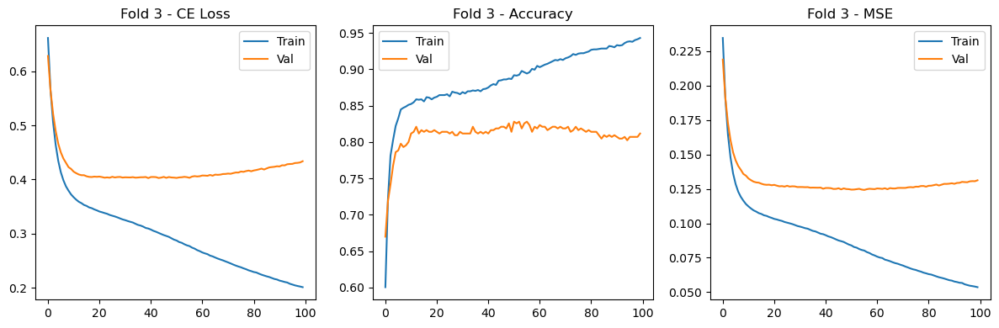


🔁 Fold 4
✅ CE Loss: 0.4039 | Acc: 0.8349 | MSE: 0.1167


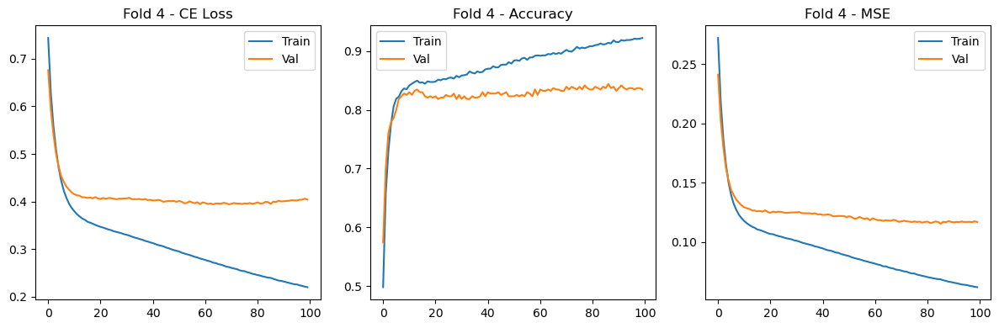


🔁 Fold 5
✅ CE Loss: 0.4043 | Acc: 0.8135 | MSE: 0.1248


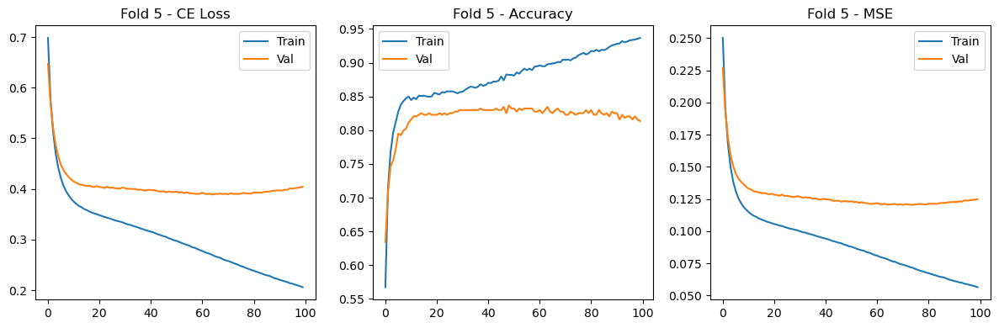


🔧 Running model with hidden size 2I/3 (22 neurons)

🔁 Fold 1
✅ CE Loss: 0.3782 | Acc: 0.8349 | MSE: 0.1151


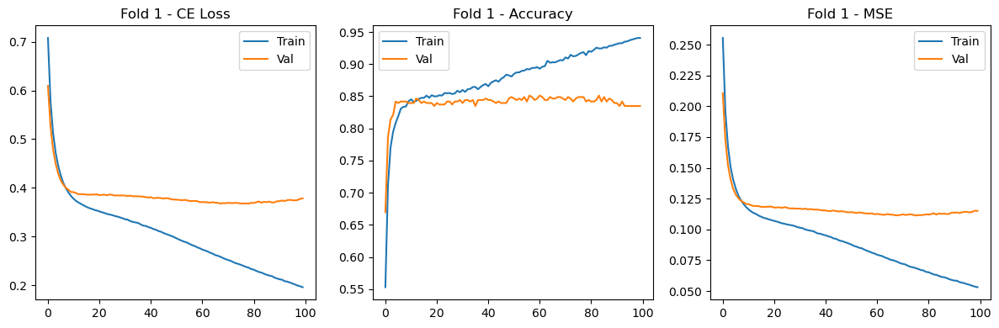


🔁 Fold 2
✅ CE Loss: 0.3470 | Acc: 0.8628 | MSE: 0.1047


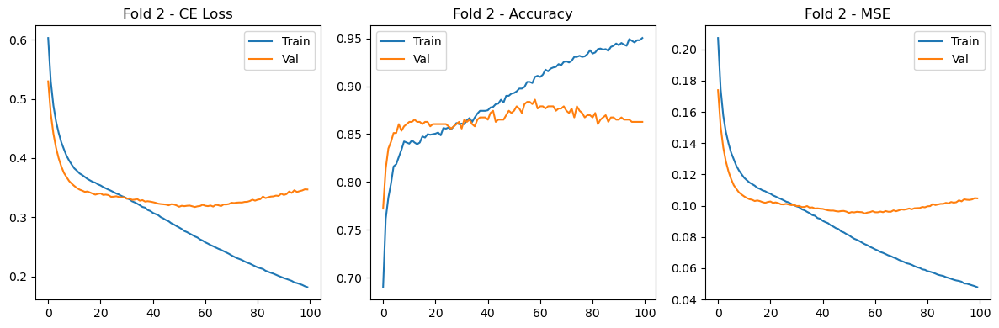


🔁 Fold 3
✅ CE Loss: 0.3869 | Acc: 0.8558 | MSE: 0.1148


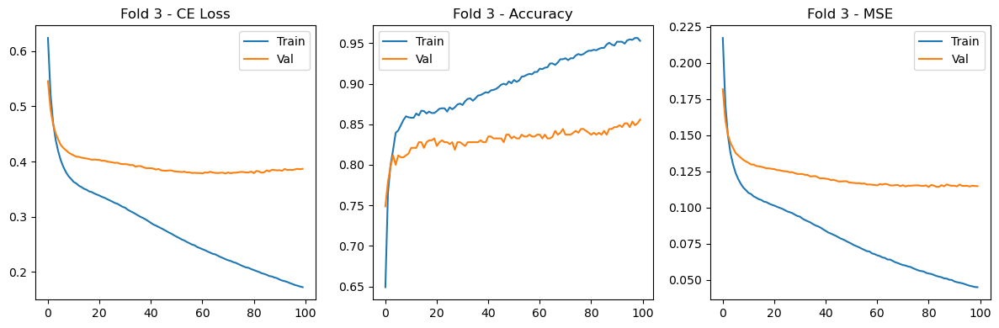


🔁 Fold 4
✅ CE Loss: 0.4227 | Acc: 0.8302 | MSE: 0.1169


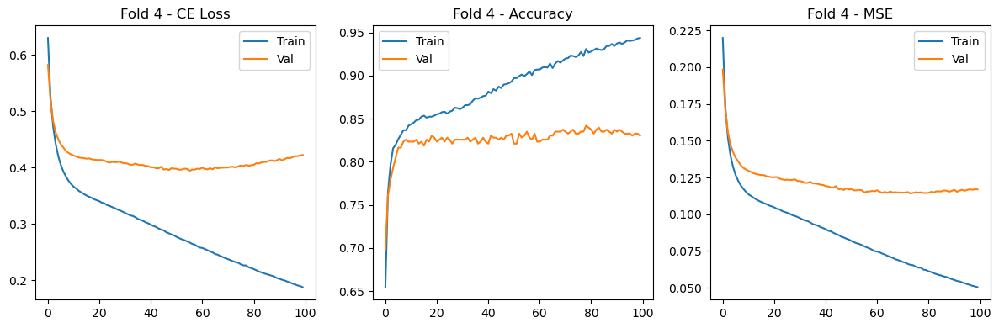


🔁 Fold 5
✅ CE Loss: 0.3964 | Acc: 0.7995 | MSE: 0.1246


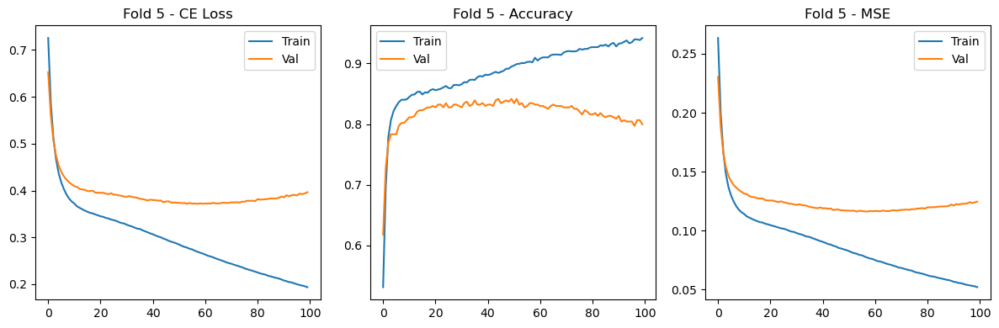


🔧 Running model with hidden size I (34 neurons)

🔁 Fold 1
✅ CE Loss: 0.3733 | Acc: 0.8465 | MSE: 0.1101


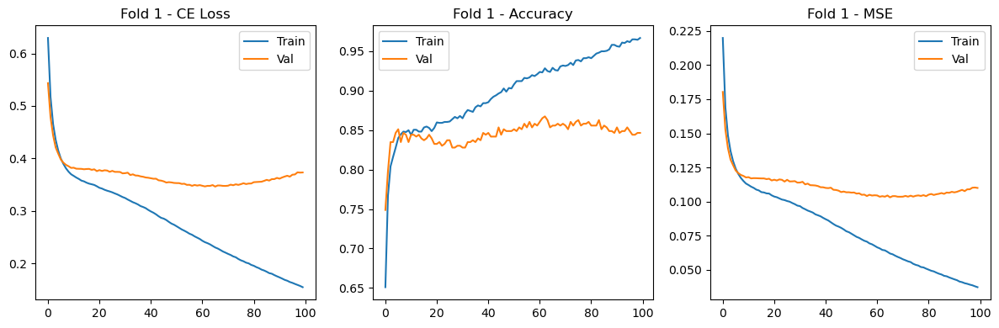


🔁 Fold 2
✅ CE Loss: 0.3248 | Acc: 0.8791 | MSE: 0.0964


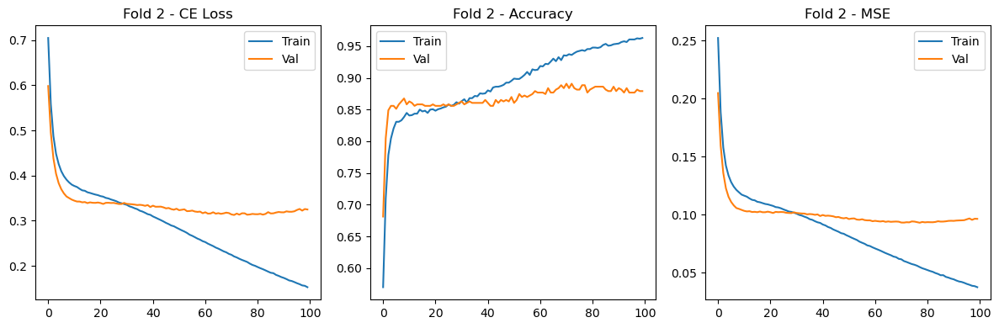


🔁 Fold 3
✅ CE Loss: 0.4029 | Acc: 0.8488 | MSE: 0.1123


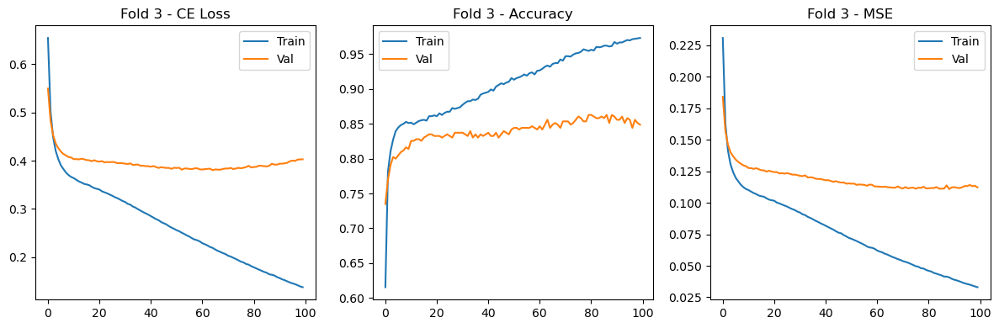


🔁 Fold 4
✅ CE Loss: 0.3819 | Acc: 0.8395 | MSE: 0.1092


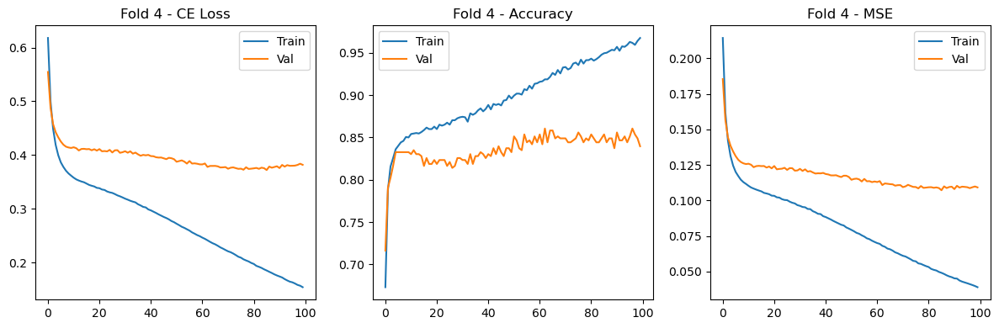


🔁 Fold 5
✅ CE Loss: 0.3813 | Acc: 0.8462 | MSE: 0.1148


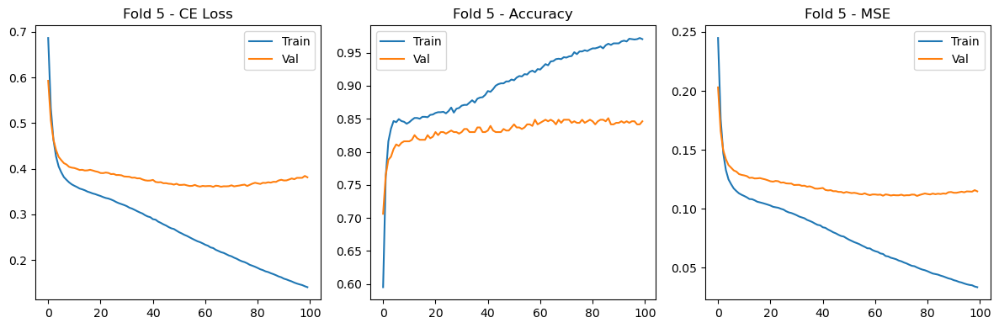


🔧 Running model with hidden size 2I (68 neurons)

🔁 Fold 1
✅ CE Loss: 0.3780 | Acc: 0.8465 | MSE: 0.1141


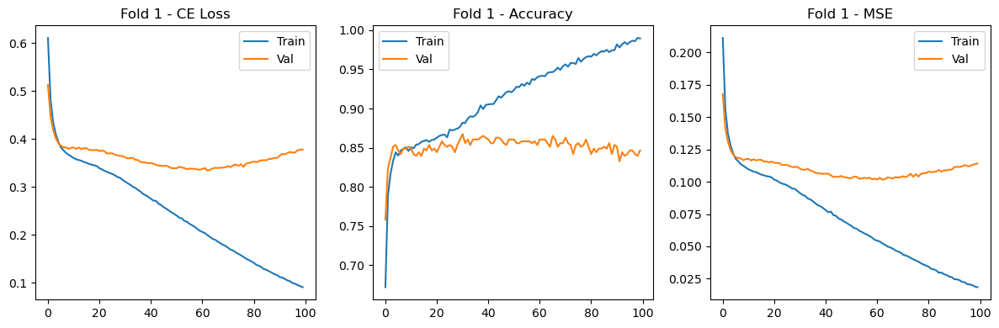


🔁 Fold 2
✅ CE Loss: 0.3510 | Acc: 0.8581 | MSE: 0.1043


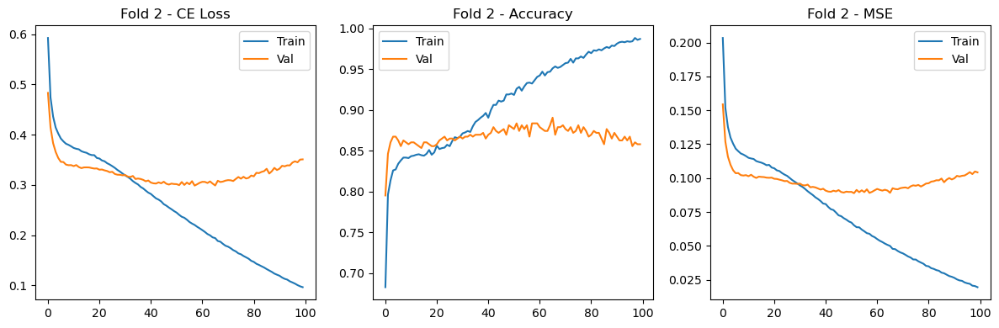


🔁 Fold 3
✅ CE Loss: 0.4602 | Acc: 0.8326 | MSE: 0.1260


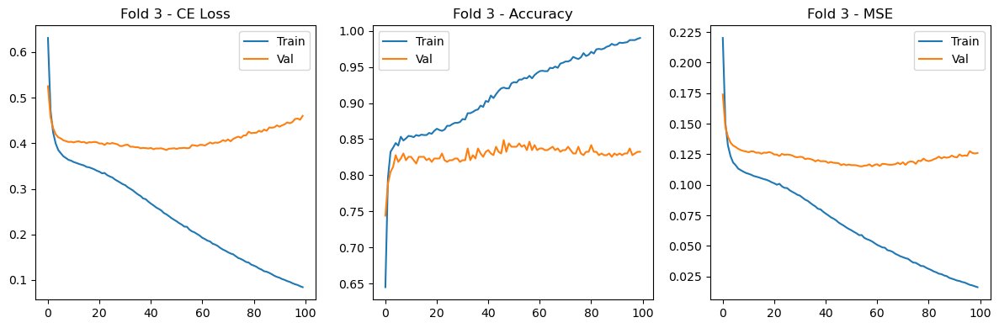


🔁 Fold 4
✅ CE Loss: 0.4074 | Acc: 0.8419 | MSE: 0.1125


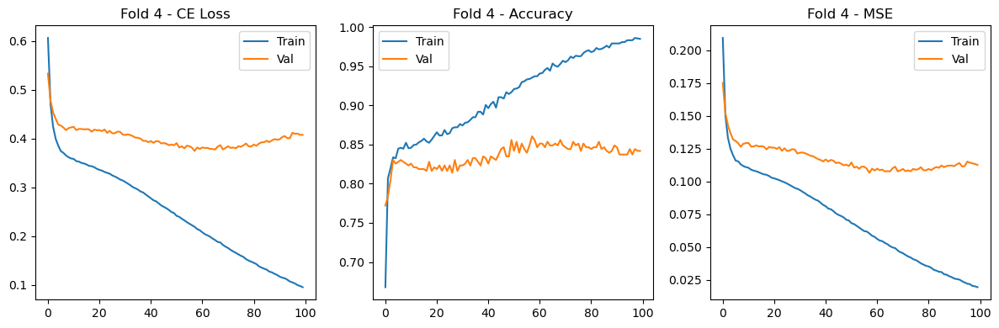


🔁 Fold 5
✅ CE Loss: 0.4423 | Acc: 0.8228 | MSE: 0.1321


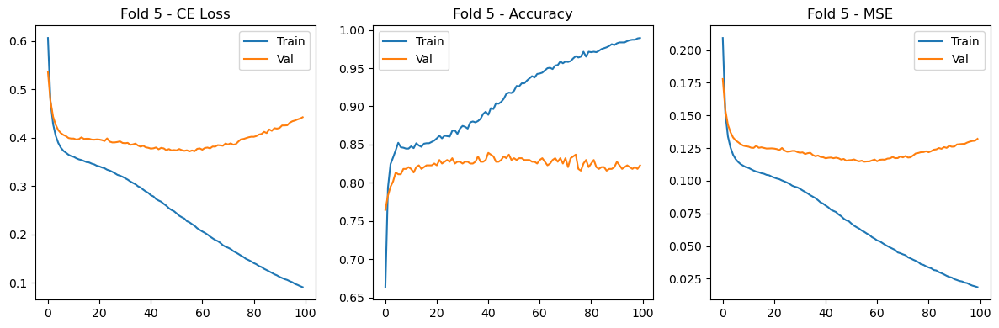

In [83]:
results_by_size = []

for label, hidden_dim in hidden_sizes.items():
    print(f"\n🔧 Running model with hidden size {label} ({hidden_dim} neurons)")
    df = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation='tanh', epochs=100)
    avg_ce = df['CE_Loss'].mean()
    avg_mse = df['MSE'].mean()
    avg_acc = df['Accuracy'].mean()
    results_by_size.append({
        'Hidden Size': label,
        'Neurons': hidden_dim,
        'CE Loss (avg)': round(avg_ce, 4),
        'MSE (avg)': round(avg_mse, 4),
        'Accuracy (avg)': round(avg_acc, 4)
    })

In [90]:
results_df = pd.DataFrame(results_by_size)
results_df

,Hidden Size,Neurons,CE Loss (avg),MSE (avg),Accuracy (avg)
0,I/2,17,0.3880,0.1163,0.8353
1,2I/3,22,0.3862,0.1152,0.8367
2,I,34,0.3729,0.1086,0.8520
3,2I,68,0.4078,0.1178,0.8404


In [86]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

In [87]:
callbacks=[early_stopping]

After early stopping


🔧 Running model with hidden size I/2 (17 neurons)

🔁 Fold 1
✅ CE Loss: 0.3514 | Acc: 0.8488 | MSE: 0.1068


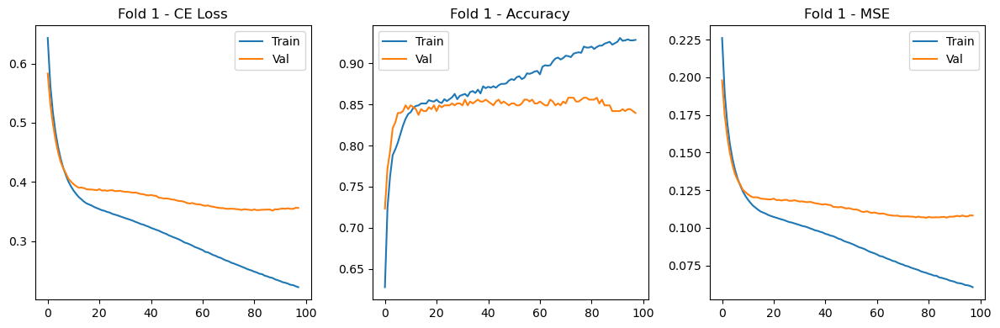


🔁 Fold 2
✅ CE Loss: 0.3178 | Acc: 0.8651 | MSE: 0.0976


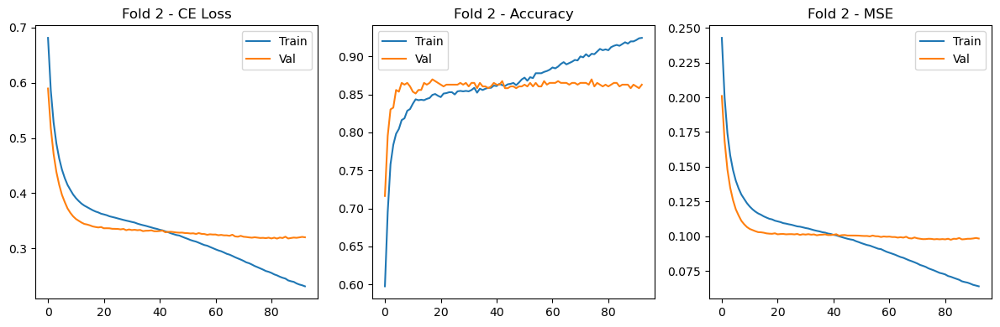


🔁 Fold 3
✅ CE Loss: 0.3953 | Acc: 0.8302 | MSE: 0.1211


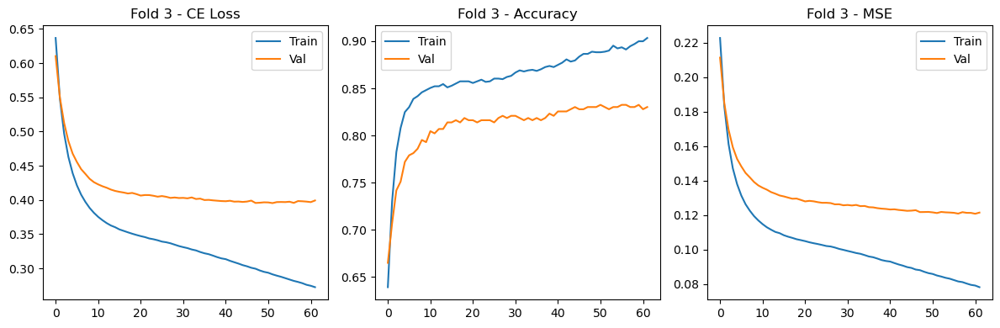


🔁 Fold 4
✅ CE Loss: 0.3787 | Acc: 0.8372 | MSE: 0.1122


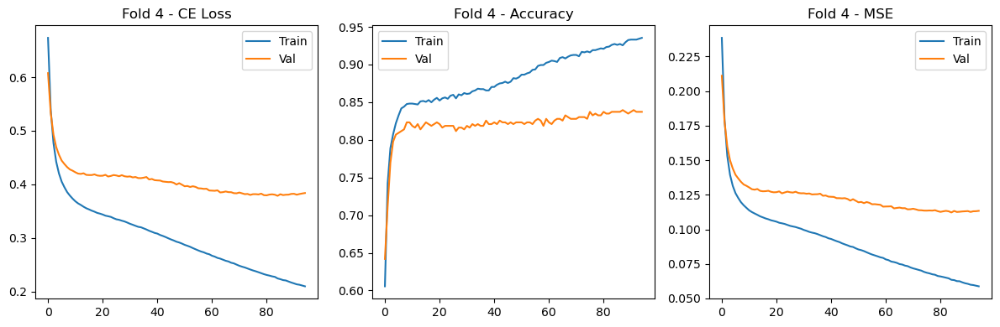


🔁 Fold 5
✅ CE Loss: 0.3754 | Acc: 0.8345 | MSE: 0.1155


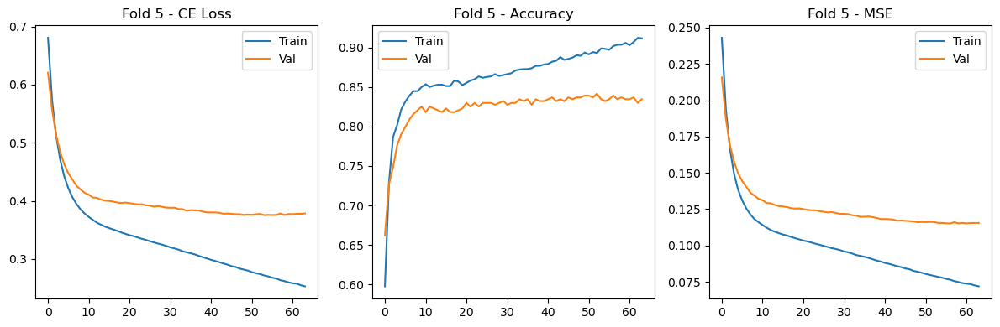


🔧 Running model with hidden size 2I/3 (22 neurons)

🔁 Fold 1
✅ CE Loss: 0.3373 | Acc: 0.8628 | MSE: 0.1017


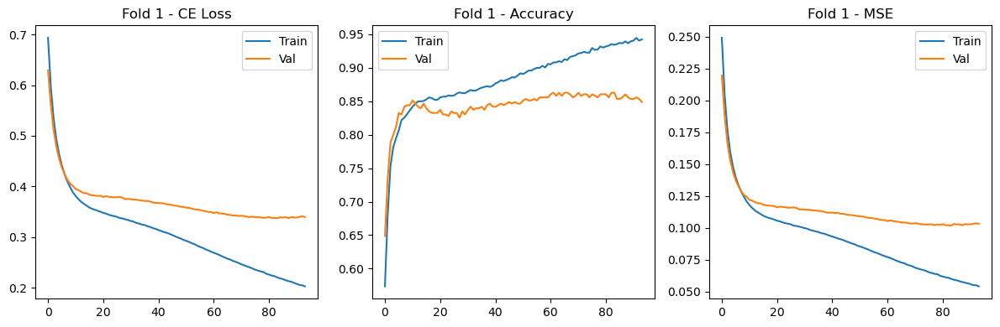


🔁 Fold 2
✅ CE Loss: 0.3393 | Acc: 0.8558 | MSE: 0.1018


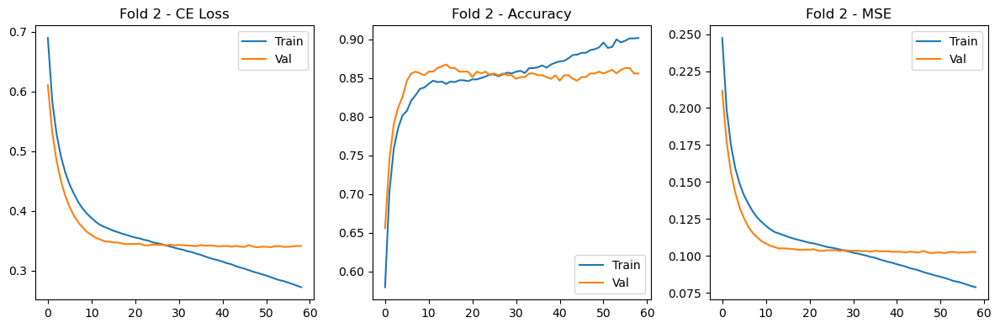


🔁 Fold 3
✅ CE Loss: 0.3983 | Acc: 0.8233 | MSE: 0.1230


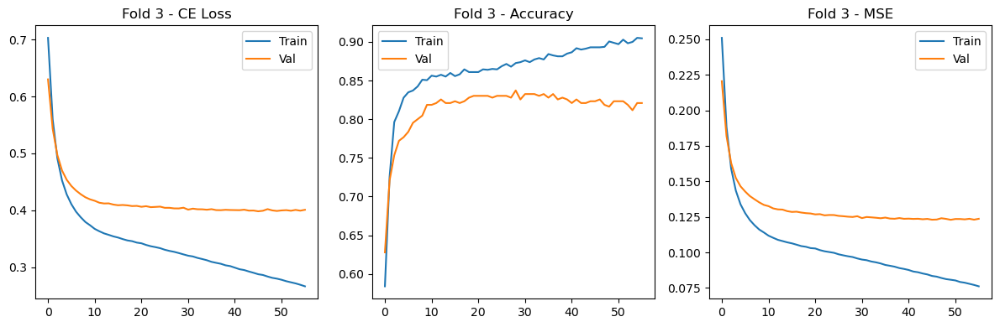


🔁 Fold 4
✅ CE Loss: 0.4189 | Acc: 0.8279 | MSE: 0.1284


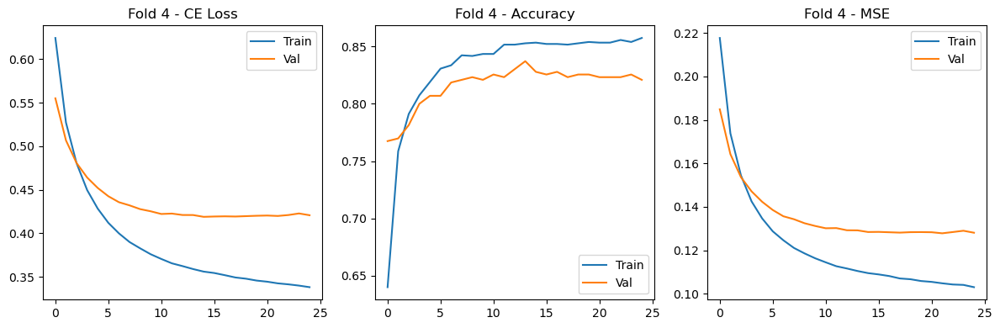


🔁 Fold 5
✅ CE Loss: 0.3711 | Acc: 0.8485 | MSE: 0.1113


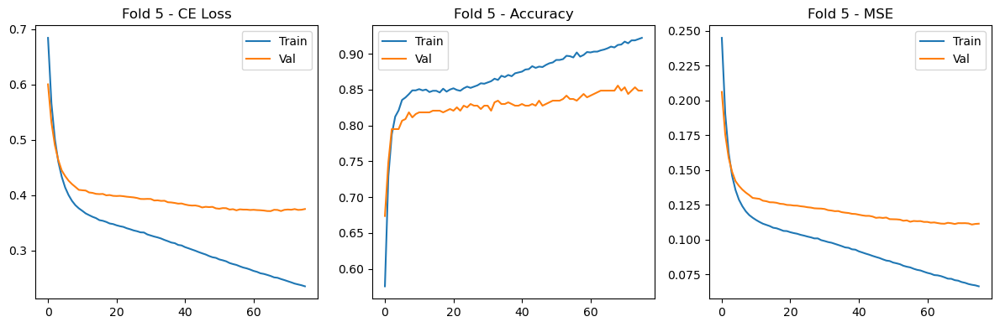


🔧 Running model with hidden size I (34 neurons)

🔁 Fold 1
✅ CE Loss: 0.3488 | Acc: 0.8488 | MSE: 0.1067


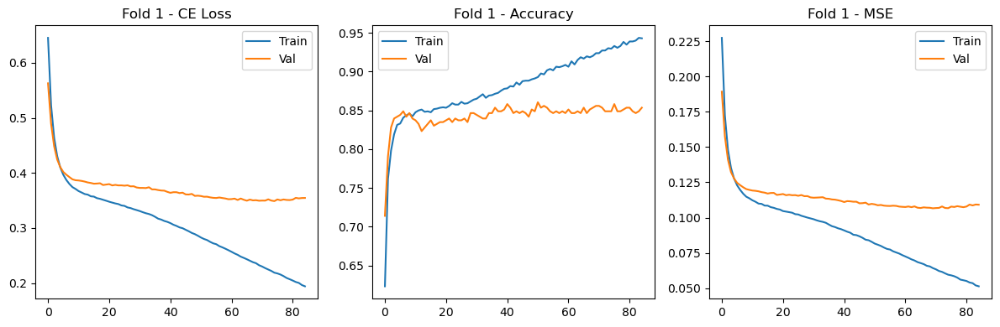


🔁 Fold 2
✅ CE Loss: 0.3109 | Acc: 0.8698 | MSE: 0.0938


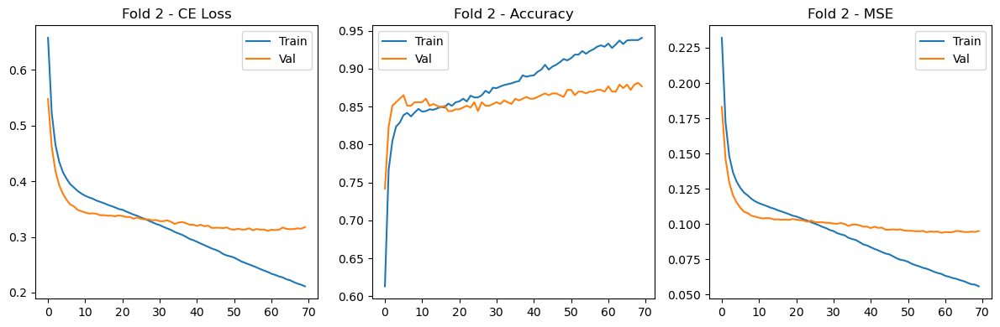


🔁 Fold 3
✅ CE Loss: 0.3774 | Acc: 0.8465 | MSE: 0.1127


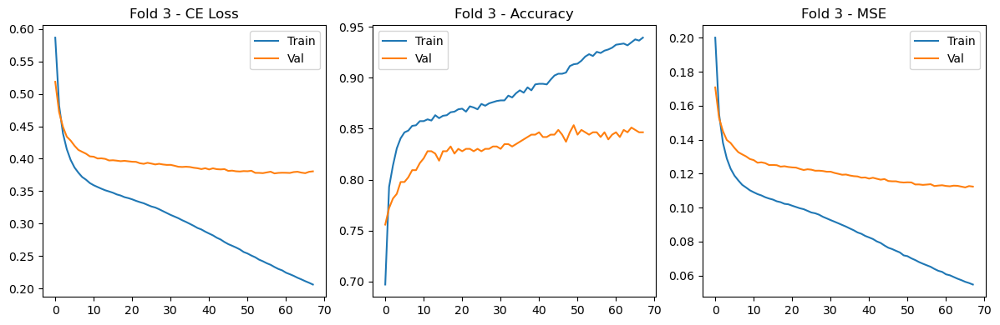


🔁 Fold 4
✅ CE Loss: 0.3856 | Acc: 0.8442 | MSE: 0.1122


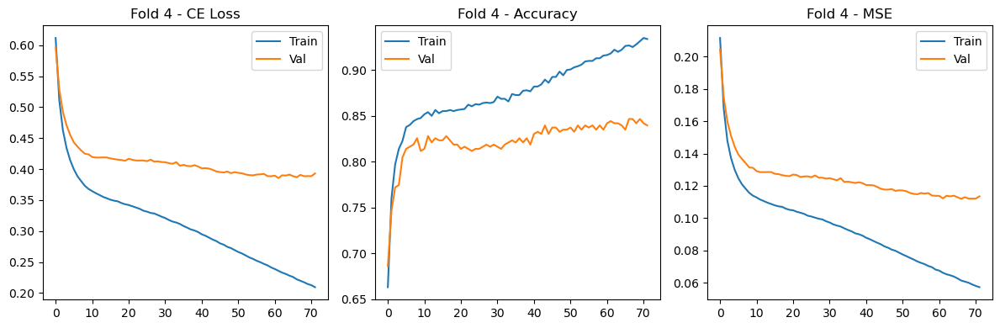


🔁 Fold 5
✅ CE Loss: 0.3602 | Acc: 0.8555 | MSE: 0.1062


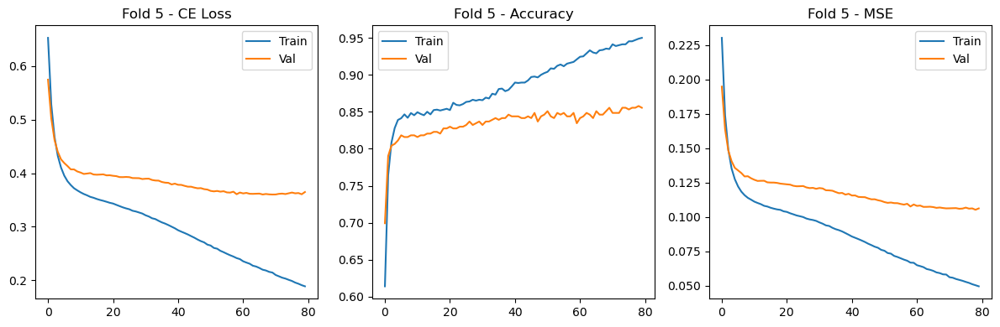


🔧 Running model with hidden size 2I (68 neurons)

🔁 Fold 1
✅ CE Loss: 0.3480 | Acc: 0.8558 | MSE: 0.1044


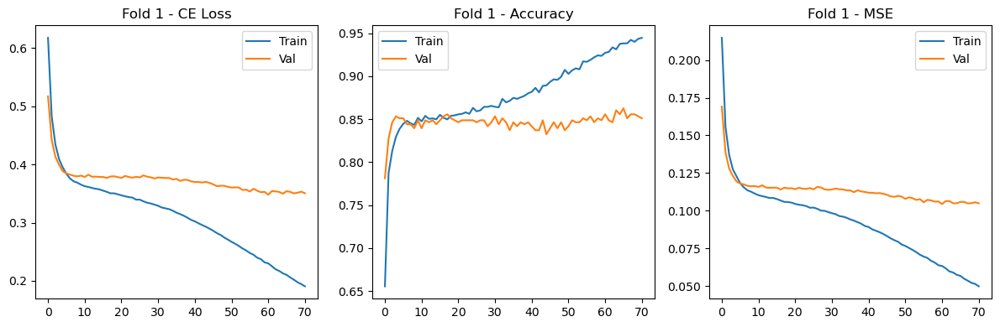


🔁 Fold 2
✅ CE Loss: 0.3180 | Acc: 0.8744 | MSE: 0.0958


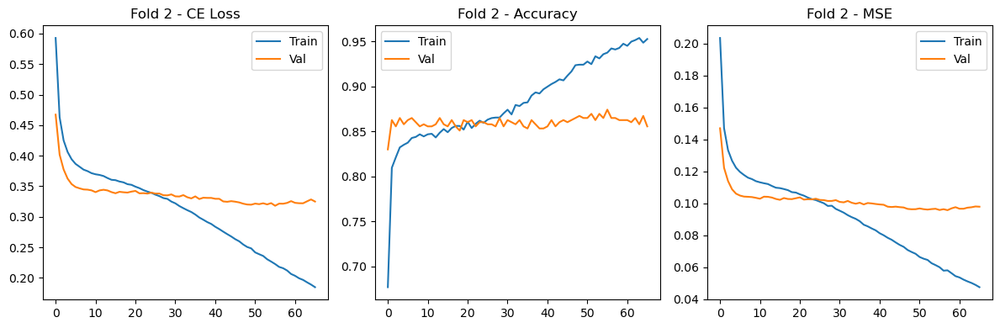


🔁 Fold 3
✅ CE Loss: 0.3831 | Acc: 0.8581 | MSE: 0.1137


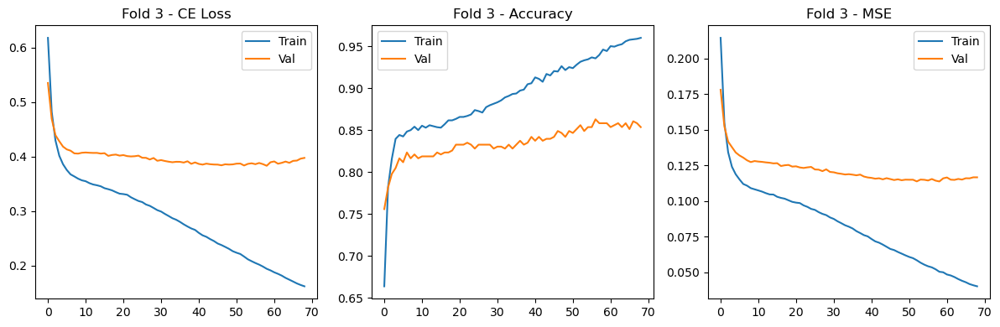


🔁 Fold 4
✅ CE Loss: 0.4074 | Acc: 0.8279 | MSE: 0.1227


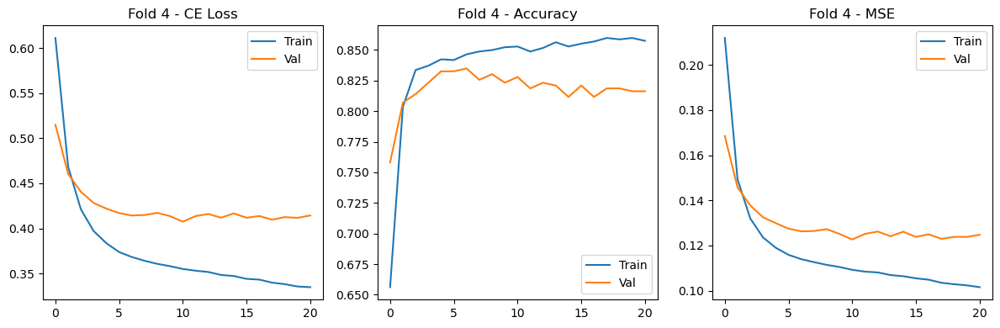


🔁 Fold 5
✅ CE Loss: 0.3792 | Acc: 0.8345 | MSE: 0.1160


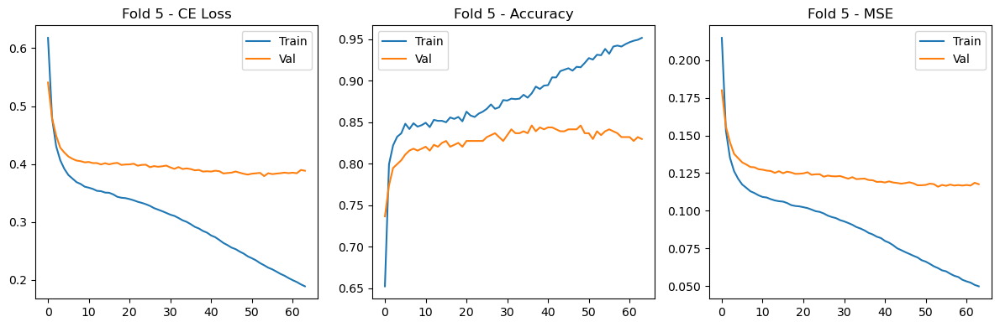

In [91]:
results_by_size = []

for label, hidden_dim in hidden_sizes.items():
    print(f"\n🔧 Running model with hidden size {label} ({hidden_dim} neurons)")
    df = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation='tanh', epochs=100)
    avg_ce = df['CE_Loss'].mean()
    avg_mse = df['MSE'].mean()
    avg_acc = df['Accuracy'].mean()
    results_by_size.append({
        'Hidden Size': label,
        'Neurons': hidden_dim,
        'CE Loss (avg)': round(avg_ce, 4),
        'MSE (avg)': round(avg_mse, 4),
        'Accuracy (avg)': round(avg_acc, 4)
    })

In [92]:
results_df = pd.DataFrame(results_by_size)
results_df

,Hidden Size,Neurons,CE Loss (avg),MSE (avg),Accuracy (avg)
0,I/2,17,0.3637,0.1107,0.8432
1,2I/3,22,0.3730,0.1133,0.8437
2,I,34,0.3566,0.1063,0.8530
3,2I,68,0.3672,0.1105,0.8502



🔧 Running model with hidden size I/2 (17 neurons)

🔁 Fold 1
✅ CE Loss: 0.5499 | Acc: 0.7535 | MSE: 0.1838


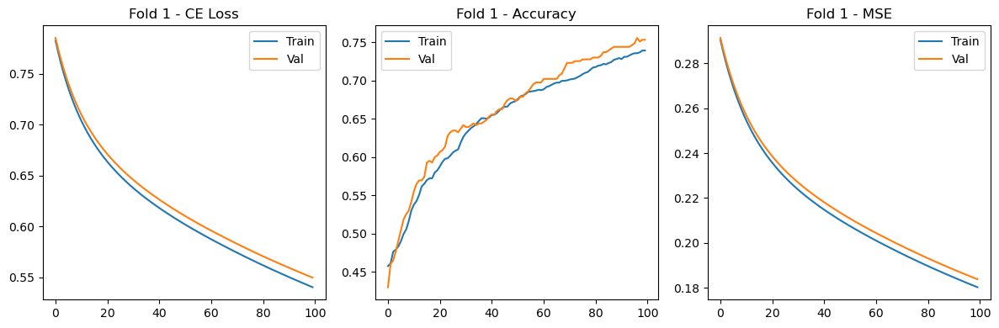


🔁 Fold 2
✅ CE Loss: 0.5085 | Acc: 0.7791 | MSE: 0.1658


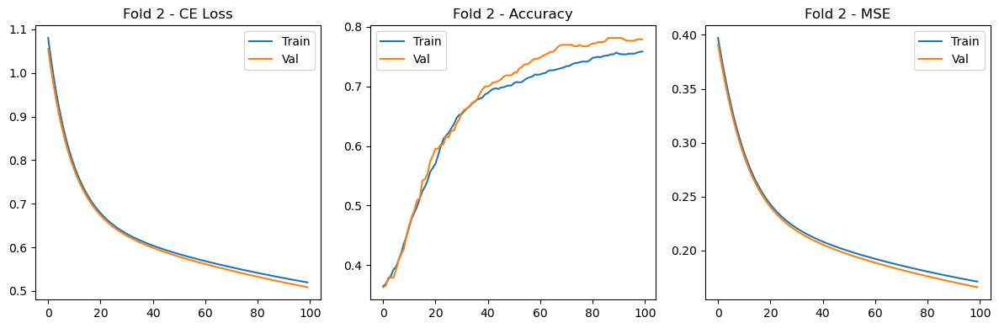


🔁 Fold 3
✅ CE Loss: 0.5515 | Acc: 0.7698 | MSE: 0.1835


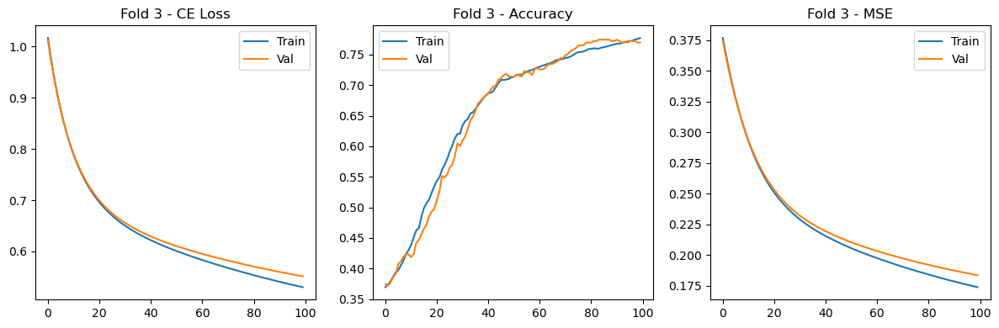


🔁 Fold 4
✅ CE Loss: 0.5851 | Acc: 0.6907 | MSE: 0.1993


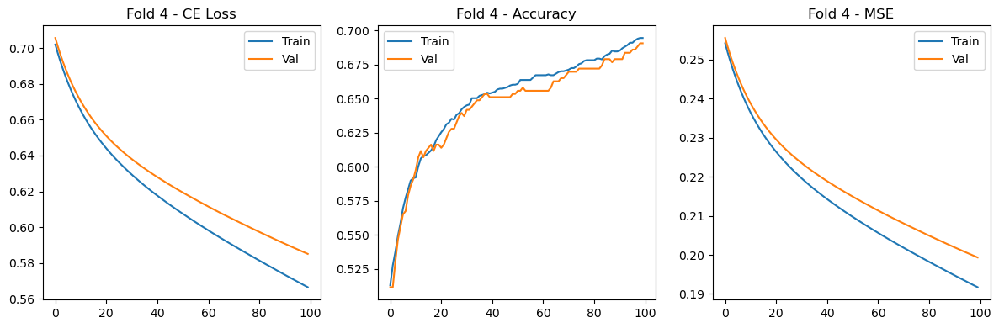


🔁 Fold 5
✅ CE Loss: 0.5821 | Acc: 0.6946 | MSE: 0.1993


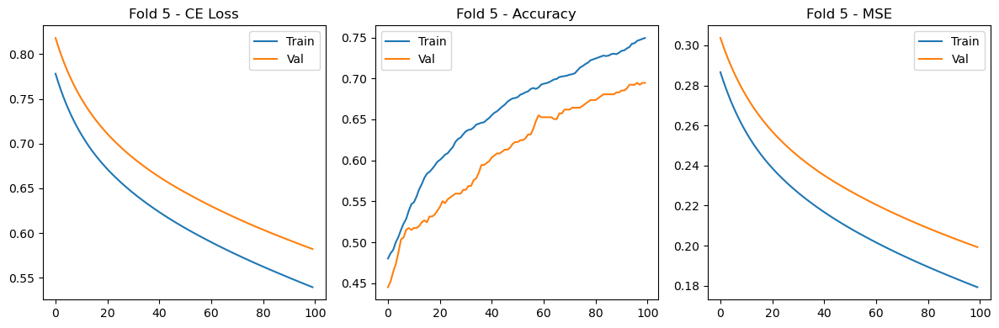


🔧 Running model with hidden size 2I/3 (22 neurons)

🔁 Fold 1
✅ CE Loss: 0.5246 | Acc: 0.7605 | MSE: 0.1717


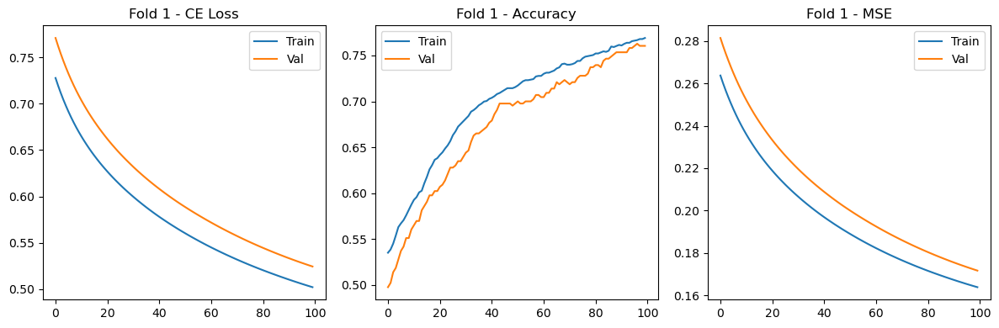


🔁 Fold 2
✅ CE Loss: 0.5189 | Acc: 0.7651 | MSE: 0.1695


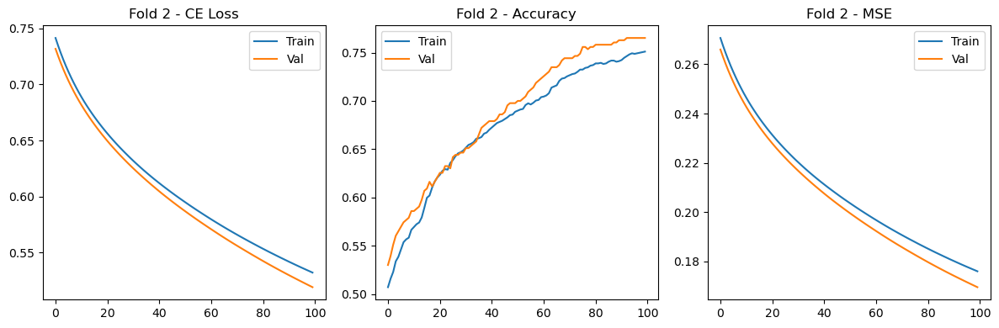


🔁 Fold 3
✅ CE Loss: 0.5487 | Acc: 0.7279 | MSE: 0.1836


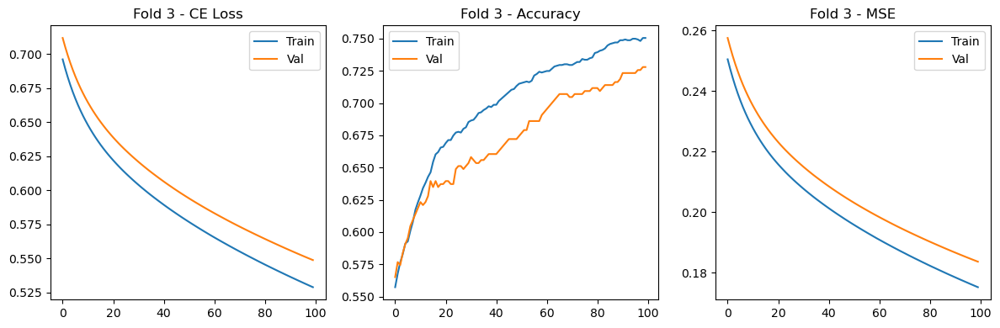


🔁 Fold 4
✅ CE Loss: 0.5611 | Acc: 0.7326 | MSE: 0.1880


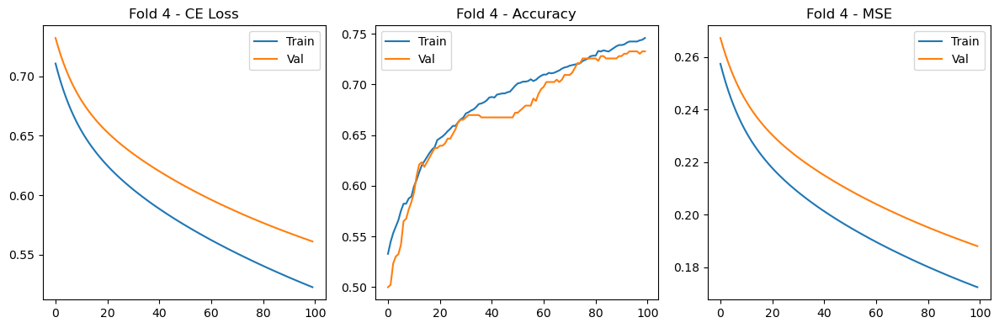


🔁 Fold 5
✅ CE Loss: 0.5048 | Acc: 0.7646 | MSE: 0.1659


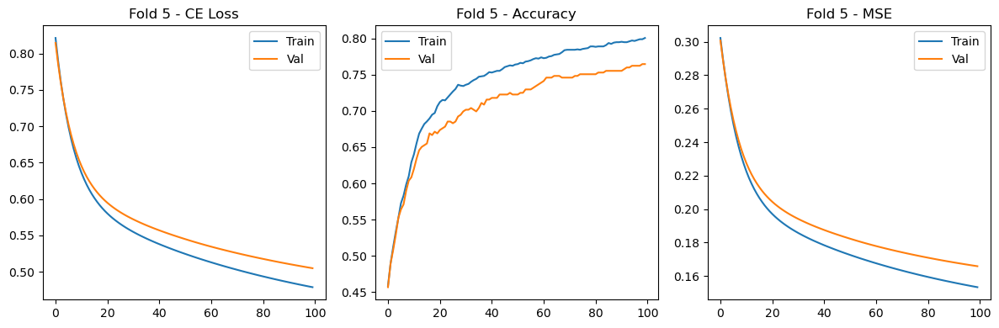


🔧 Running model with hidden size I (34 neurons)

🔁 Fold 1
✅ CE Loss: 0.5187 | Acc: 0.7930 | MSE: 0.1700


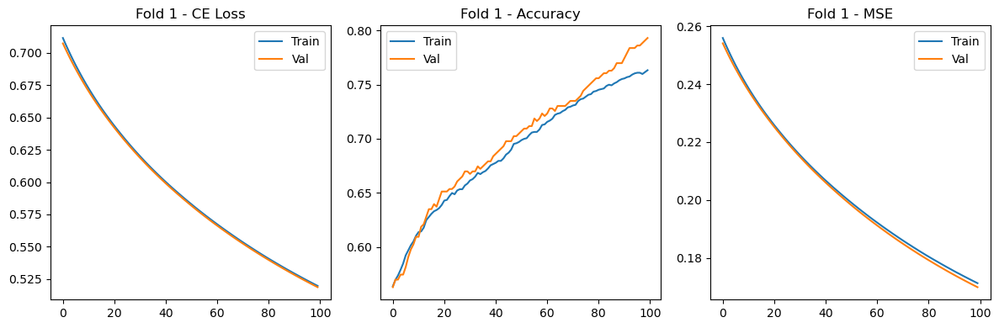


🔁 Fold 2
✅ CE Loss: 0.5216 | Acc: 0.7605 | MSE: 0.1708


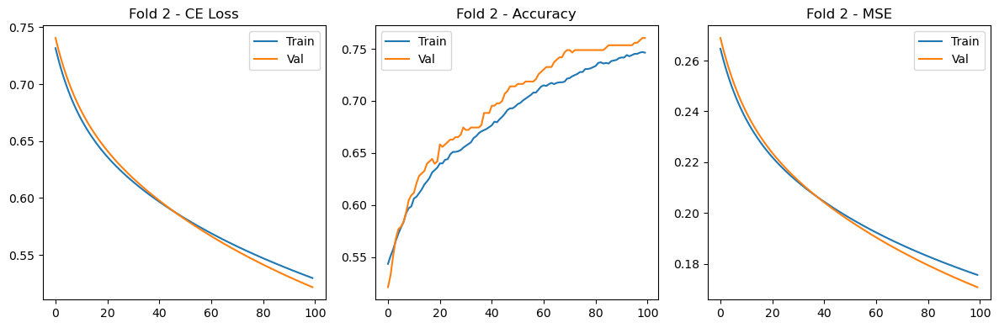


🔁 Fold 3
✅ CE Loss: 0.5045 | Acc: 0.7860 | MSE: 0.1645


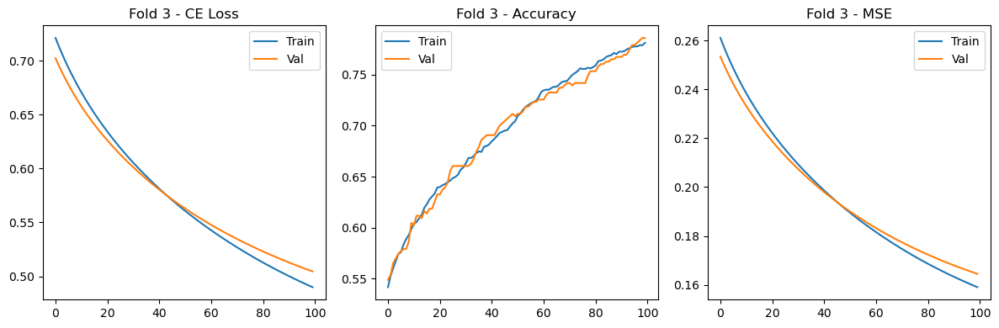


🔁 Fold 4
✅ CE Loss: 0.5284 | Acc: 0.7558 | MSE: 0.1735


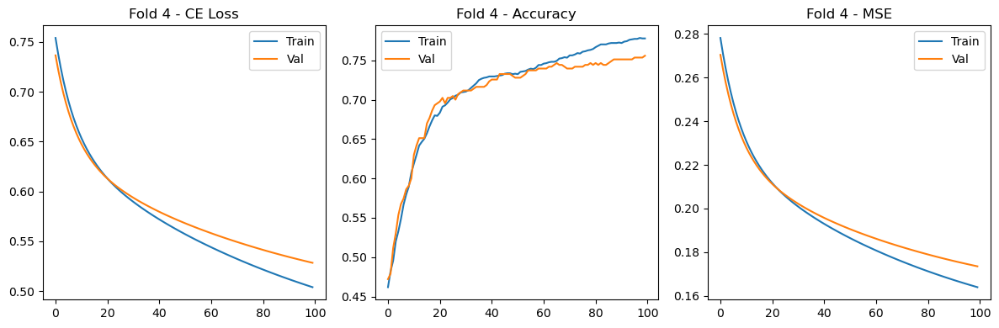


🔁 Fold 5
✅ CE Loss: 0.5074 | Acc: 0.7762 | MSE: 0.1658


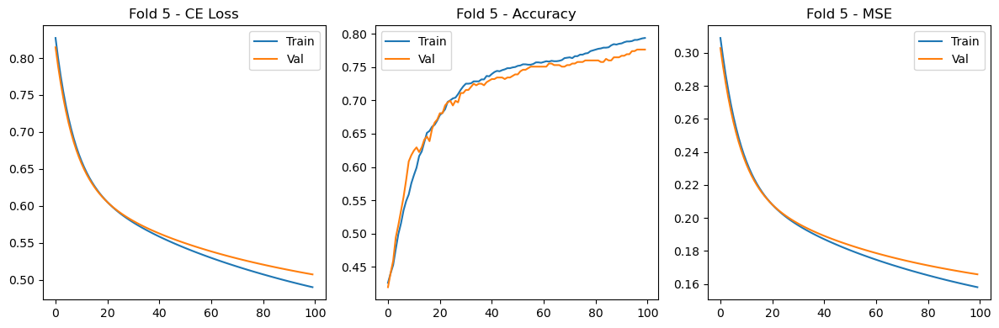


🔧 Running model with hidden size 2I (68 neurons)

🔁 Fold 1
✅ CE Loss: 0.4899 | Acc: 0.8023 | MSE: 0.1576


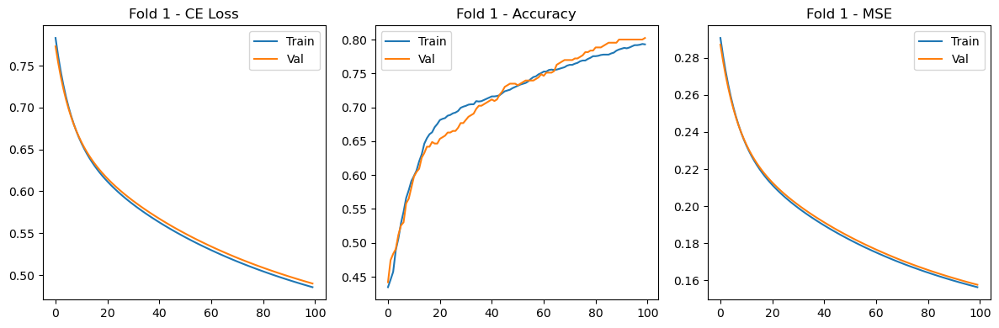


🔁 Fold 2
✅ CE Loss: 0.4837 | Acc: 0.8023 | MSE: 0.1554


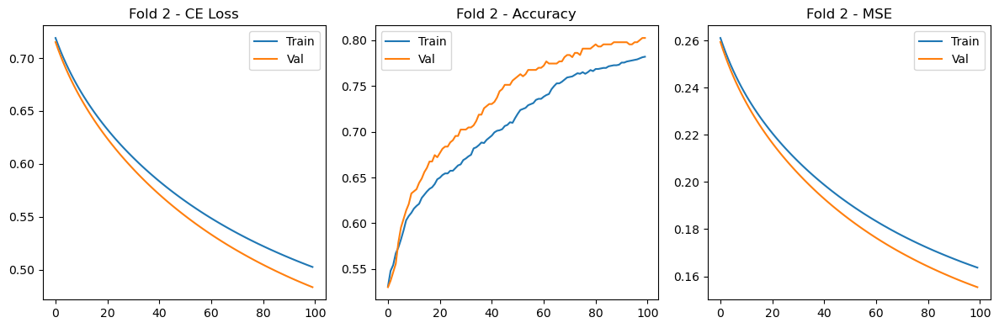


🔁 Fold 3
✅ CE Loss: 0.5062 | Acc: 0.7791 | MSE: 0.1656


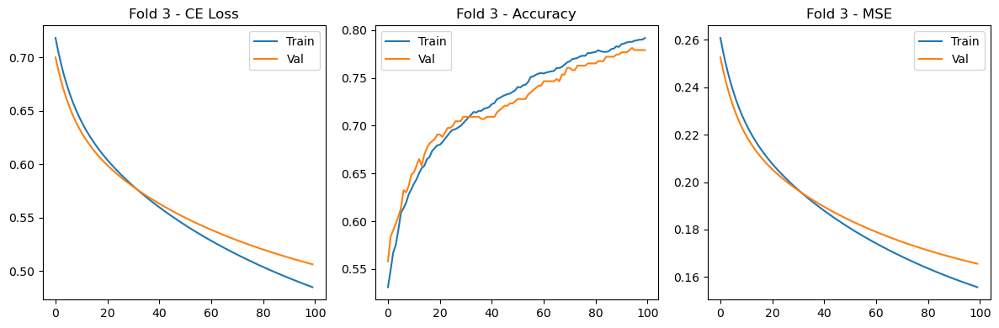


🔁 Fold 4
✅ CE Loss: 0.4957 | Acc: 0.7837 | MSE: 0.1599


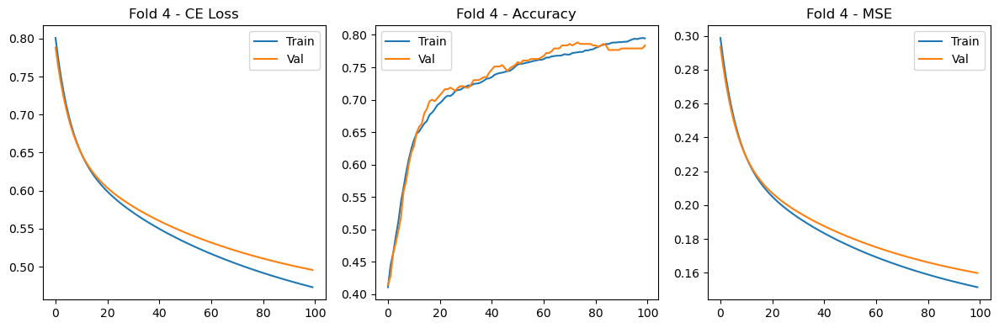


🔁 Fold 5
✅ CE Loss: 0.5200 | Acc: 0.7529 | MSE: 0.1713


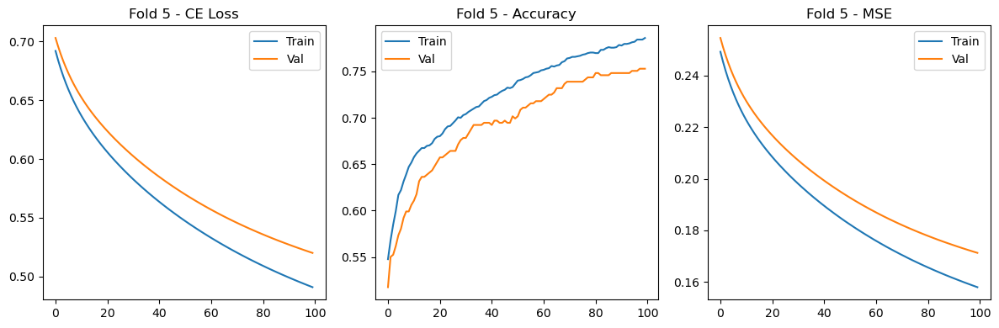

In [95]:
results_by_size = []

for label, hidden_dim in hidden_sizes.items():
    print(f"\n🔧 Running model with hidden size {label} ({hidden_dim} neurons)")
    df = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation='relu', epochs=100)
    avg_ce = df['CE_Loss'].mean()
    avg_mse = df['MSE'].mean()
    avg_acc = df['Accuracy'].mean()
    results_by_size.append({
        'Hidden Size': label,
        'Neurons': hidden_dim,
        'CE Loss (avg)': round(avg_ce, 4),
        'MSE (avg)': round(avg_mse, 4),
        'Accuracy (avg)': round(avg_acc, 4)
    })

In [96]:
results_df = pd.DataFrame(results_by_size)
results_df

,Hidden Size,Neurons,CE Loss (avg),MSE (avg),Accuracy (avg)
0,I/2,17,0.5554,0.1864,0.7375
1,2I/3,22,0.5316,0.1757,0.7501
2,I,34,0.5161,0.1689,0.7743
3,2I,68,0.4991,0.1620,0.7841



🔧 Running model with hidden size I/2 (17 neurons)

🔁 Fold 1
✅ CE Loss: 0.5405 | Acc: 0.7512 | MSE: 0.1800


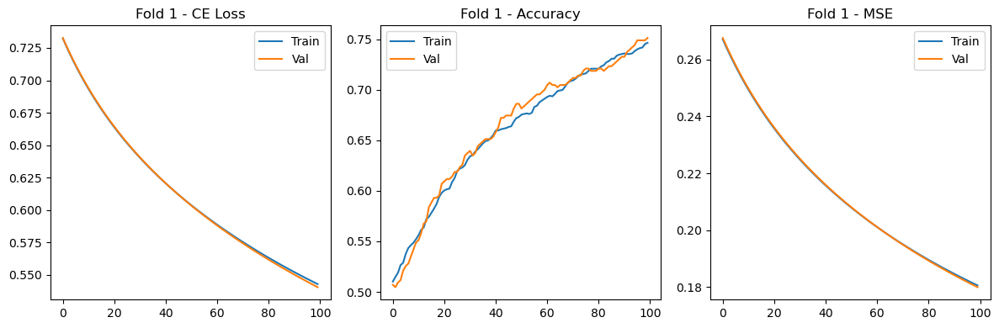


🔁 Fold 2
✅ CE Loss: 0.5548 | Acc: 0.7140 | MSE: 0.1862


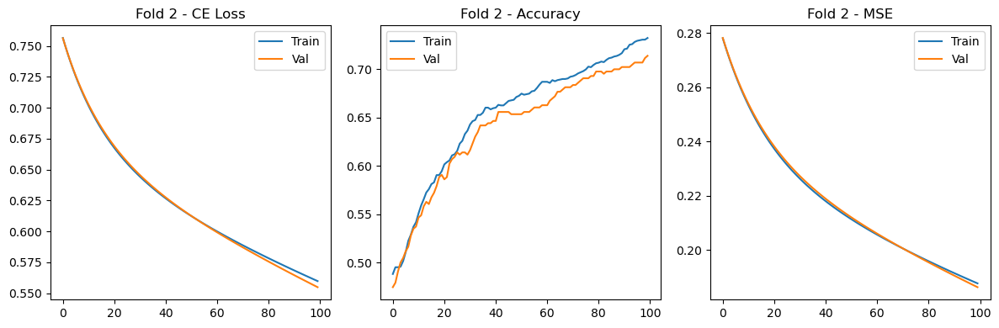


🔁 Fold 3
✅ CE Loss: 0.5162 | Acc: 0.7744 | MSE: 0.1686


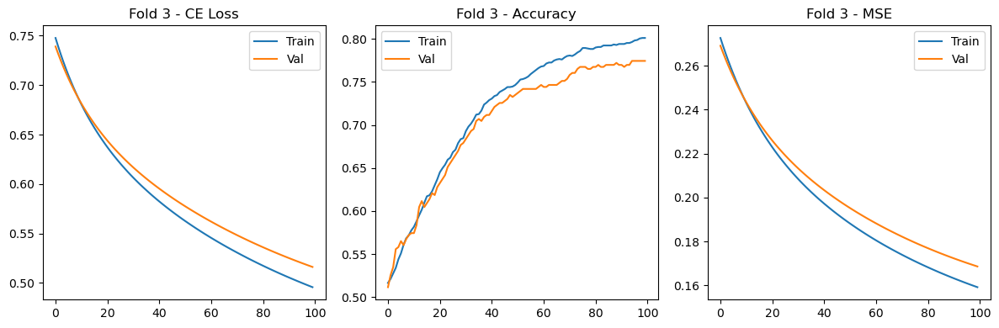


🔁 Fold 4
✅ CE Loss: 0.5661 | Acc: 0.7233 | MSE: 0.1905


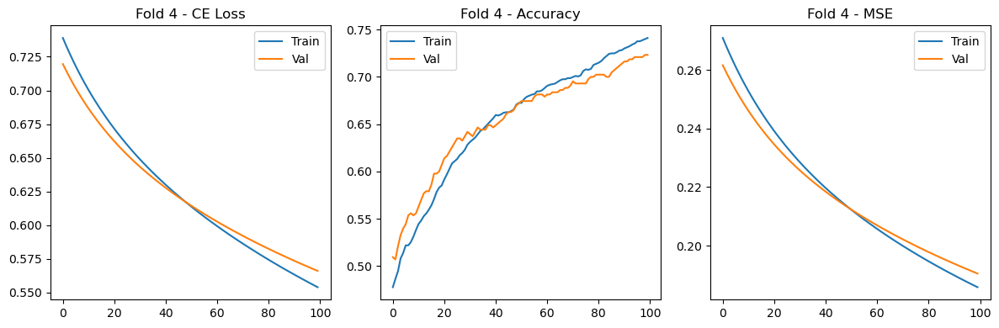


🔁 Fold 5
✅ CE Loss: 0.5195 | Acc: 0.7576 | MSE: 0.1712


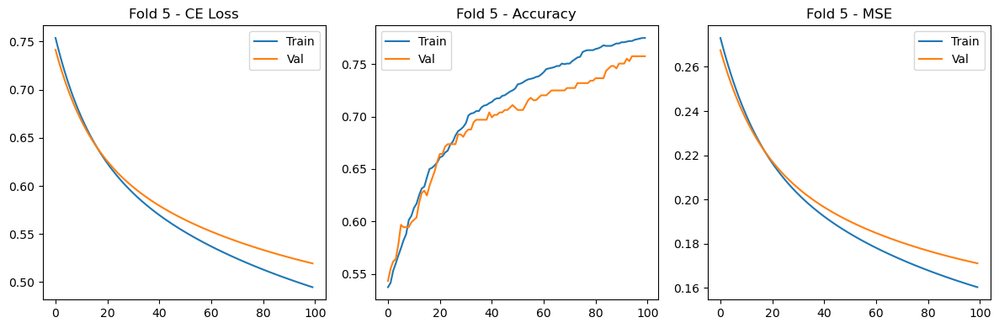


🔧 Running model with hidden size 2I/3 (22 neurons)

🔁 Fold 1
✅ CE Loss: 0.5583 | Acc: 0.7395 | MSE: 0.1878


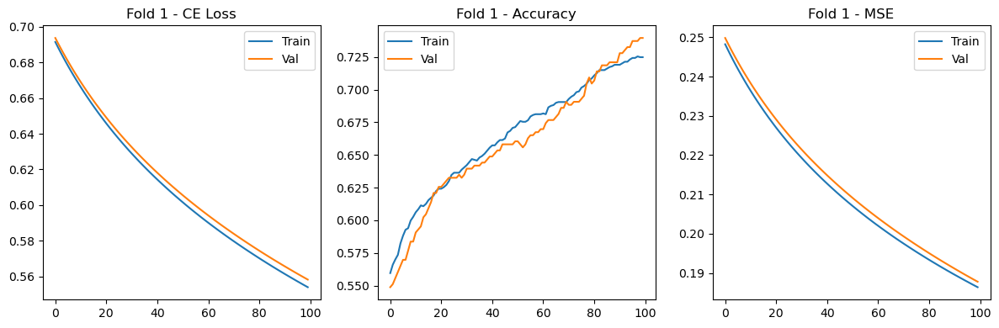


🔁 Fold 2
✅ CE Loss: 0.5134 | Acc: 0.7698 | MSE: 0.1682


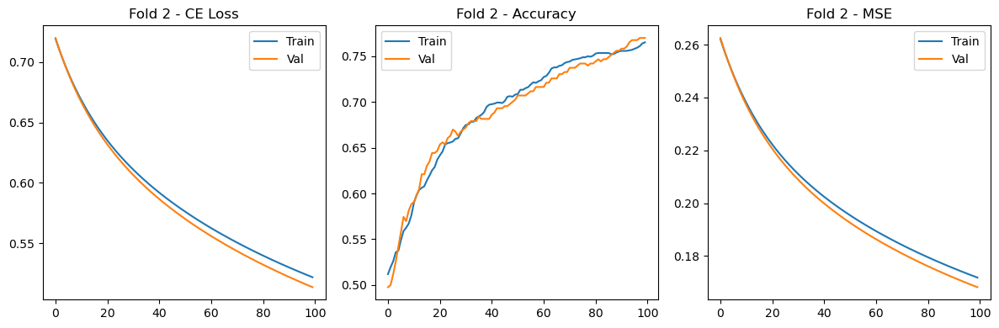


🔁 Fold 3
✅ CE Loss: 0.5540 | Acc: 0.7093 | MSE: 0.1859


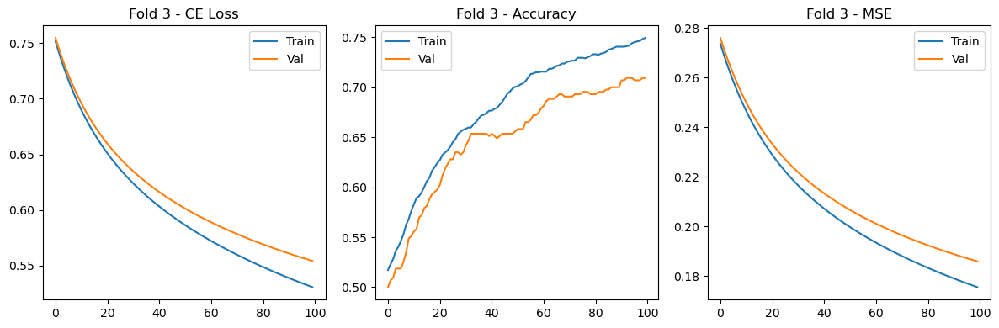


🔁 Fold 4
✅ CE Loss: 0.5296 | Acc: 0.7767 | MSE: 0.1740


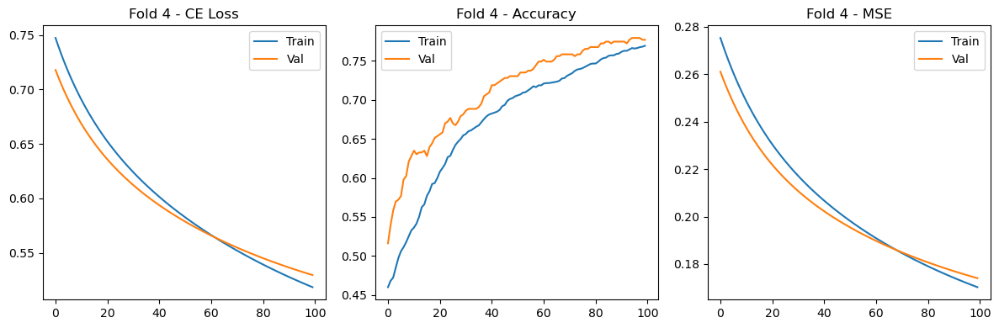


🔁 Fold 5
✅ CE Loss: 0.5366 | Acc: 0.7552 | MSE: 0.1790


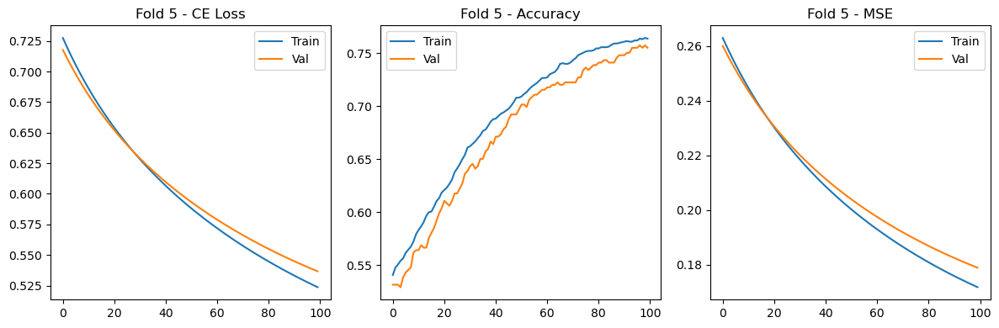


🔧 Running model with hidden size I (34 neurons)

🔁 Fold 1
✅ CE Loss: 0.5260 | Acc: 0.7558 | MSE: 0.1731


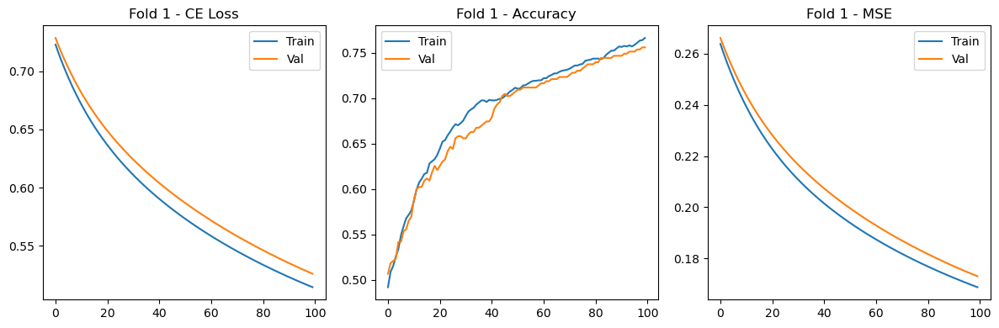


🔁 Fold 2
✅ CE Loss: 0.5255 | Acc: 0.7465 | MSE: 0.1731


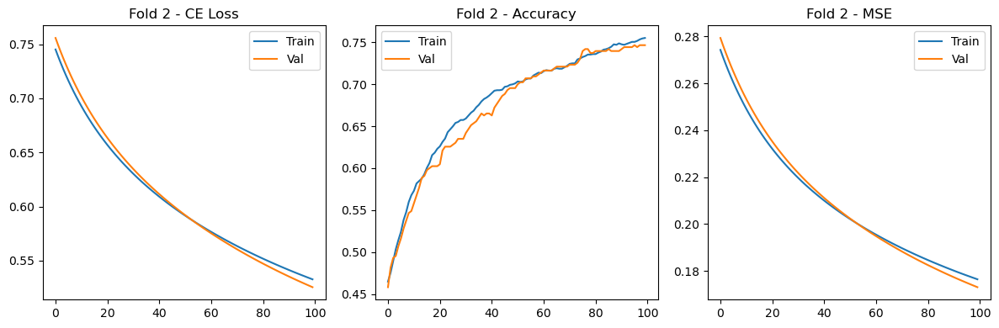


🔁 Fold 3
✅ CE Loss: 0.5088 | Acc: 0.8000 | MSE: 0.1659


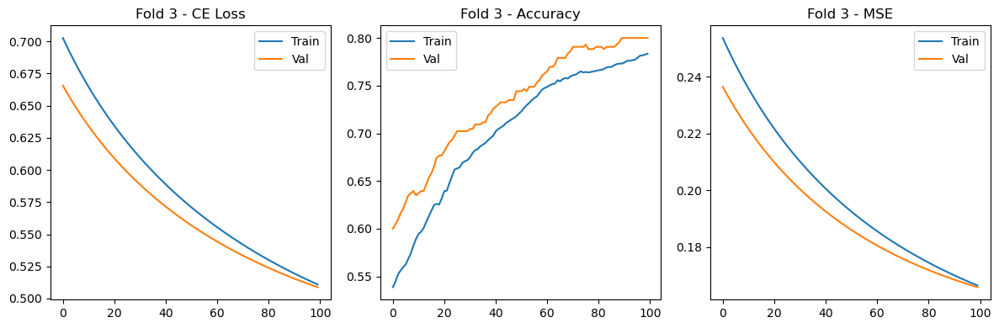


🔁 Fold 4
✅ CE Loss: 0.5255 | Acc: 0.7744 | MSE: 0.1717


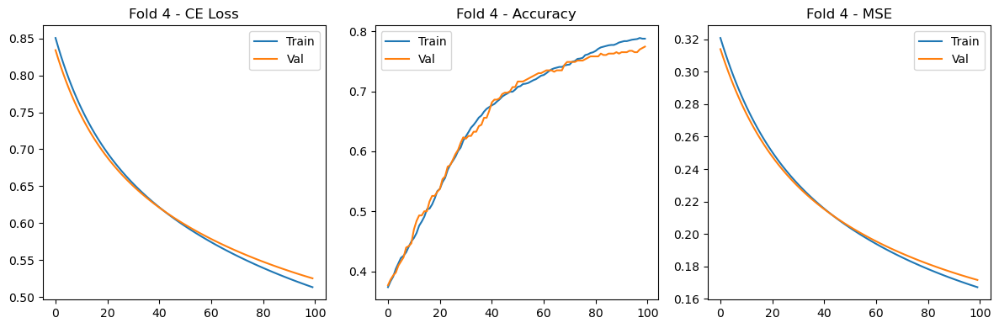


🔁 Fold 5
✅ CE Loss: 0.4936 | Acc: 0.7622 | MSE: 0.1612


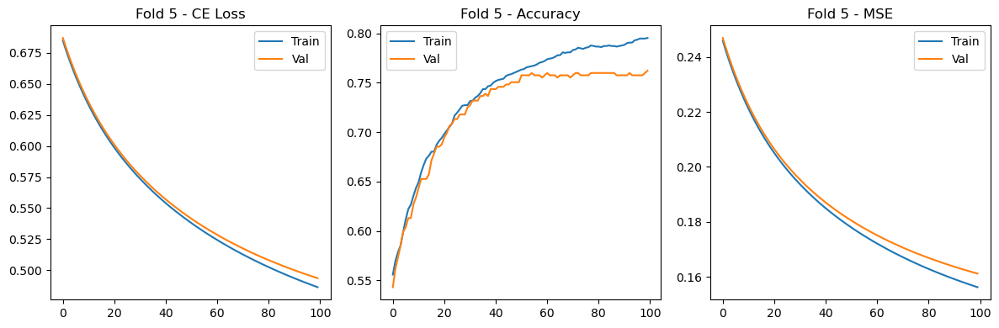


🔧 Running model with hidden size 2I (68 neurons)

🔁 Fold 1
✅ CE Loss: 0.4897 | Acc: 0.8093 | MSE: 0.1571


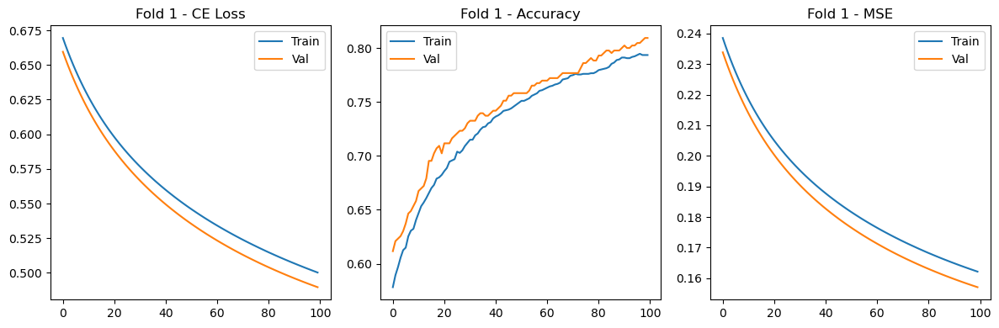


🔁 Fold 2
✅ CE Loss: 0.5015 | Acc: 0.7837 | MSE: 0.1631


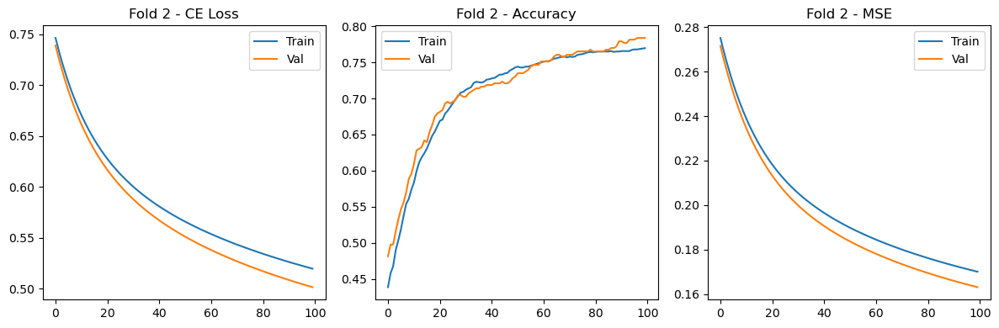


🔁 Fold 3
✅ CE Loss: 0.5001 | Acc: 0.7674 | MSE: 0.1633


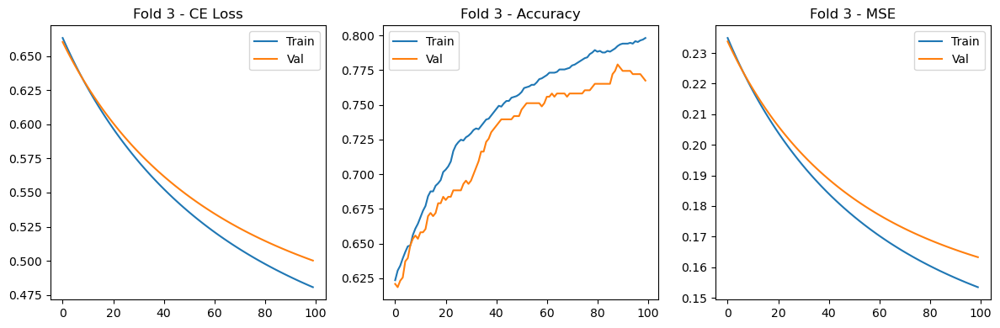


🔁 Fold 4
✅ CE Loss: 0.5014 | Acc: 0.7953 | MSE: 0.1623


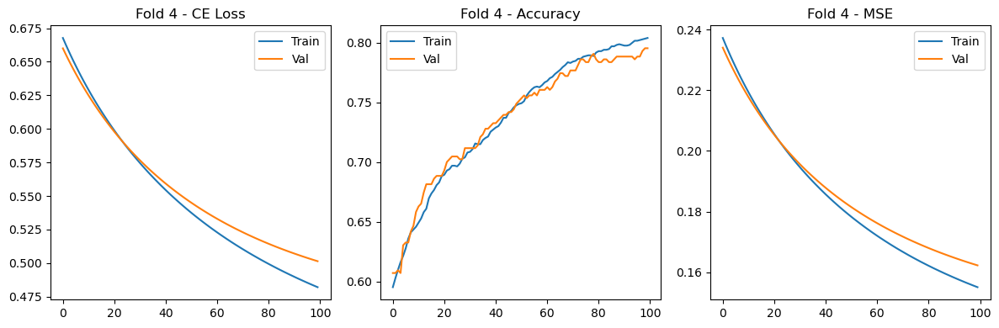


🔁 Fold 5
✅ CE Loss: 0.5066 | Acc: 0.7646 | MSE: 0.1662


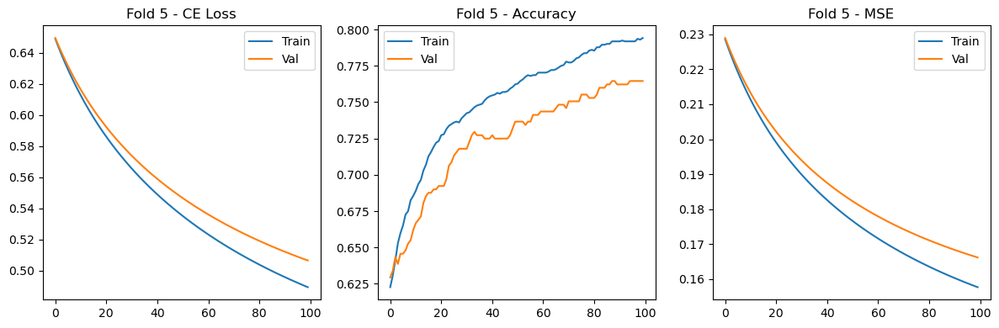

In [97]:
results_by_size = []

for label, hidden_dim in hidden_sizes.items():
    print(f"\n🔧 Running model with hidden size {label} ({hidden_dim} neurons)")
    df = run_5fold_cv(X, y, hidden_dim=hidden_dim, activation=tf.nn.silu, epochs=100)
    avg_ce = df['CE_Loss'].mean()
    avg_mse = df['MSE'].mean()
    avg_acc = df['Accuracy'].mean()
    results_by_size.append({
        'Hidden Size': label,
        'Neurons': hidden_dim,
        'CE Loss (avg)': round(avg_ce, 4),
        'MSE (avg)': round(avg_mse, 4),
        'Accuracy (avg)': round(avg_acc, 4)
    })

In [98]:
results_df = pd.DataFrame(results_by_size)
results_df

,Hidden Size,Neurons,CE Loss (avg),MSE (avg),Accuracy (avg)
0,I/2,17,0.5394,0.1793,0.7441
1,2I/3,22,0.5384,0.1790,0.7501
2,I,34,0.5159,0.1690,0.7678
3,2I,68,0.4999,0.1624,0.7841


A3

In [99]:
def plot_training_history(history, fold):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.plot(history.history['loss'], label='Train')
    plt.plot(history.history['val_loss'], label='Val')
    plt.title(f'Fold {fold} - CE Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(history.history['accuracy'], label='Train')
    plt.plot(history.history['val_accuracy'], label='Val')
    plt.title(f'Fold {fold} - Accuracy')
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(history.history['mean_squared_error'], label='Train')
    plt.plot(history.history['val_mean_squared_error'], label='Val')
    plt.title(f'Fold {fold} - MSE')
    plt.legend()

    plt.tight_layout()
    plt.show()

#model w momentum
def build_model_with_momentum(input_dim, hidden_dim, learning_rate=0.001, momentum=0.0, activation='tanh'):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(hidden_dim, activation=activation),
        layers.Dense(1, activation='sigmoid')
    ])

    optimizer = keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)

    model.compile(
        optimizer=optimizer,
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.MeanSquaredError()]
    )
    return model

# --- 5-Fold CV Runner ---
def run_5fold_cv(X, y, hidden_dim, activation='tanh', epochs=100, batch_size=32, learning_rate=0.001, momentum=0.0):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    fold_metrics = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\n🔁 Fold {fold+1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = build_model_with_momentum(
            input_dim=X.shape[1],
            hidden_dim=hidden_dim,
            learning_rate=learning_rate,
            momentum=momentum,
            activation=activation
        )

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=0
        )

        scores = model.evaluate(X_val, y_val, verbose=0)
        metrics_dict = {
            'Fold': fold+1,
            'CE_Loss': scores[0],
            'Accuracy': scores[1],
            'MSE': scores[2]
        }
        fold_metrics.append(metrics_dict)
        print(f"✅ CE Loss: {scores[0]:.4f} | Acc: {scores[1]:.4f} | MSE: {scores[2]:.4f}")

        plot_training_history(history, fold+1)

    return pd.DataFrame(fold_metrics)

l.rate = 0.001, momentum=0.2


🔁 Fold 1
✅ CE Loss: 0.4461 | Acc: 0.8279 | MSE: 0.1408


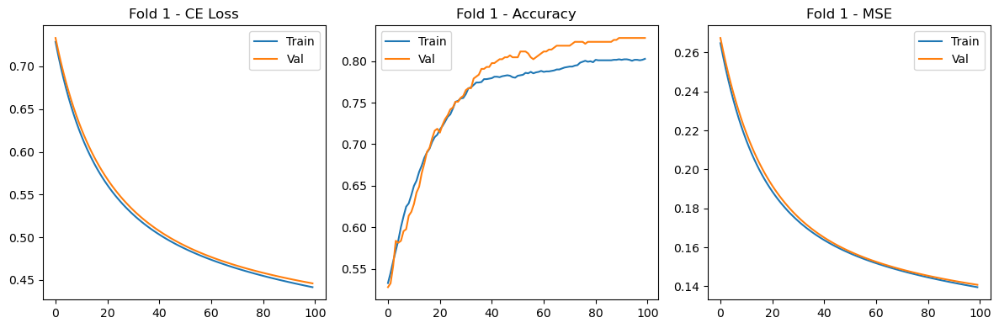


🔁 Fold 2
✅ CE Loss: 0.4141 | Acc: 0.8465 | MSE: 0.1272


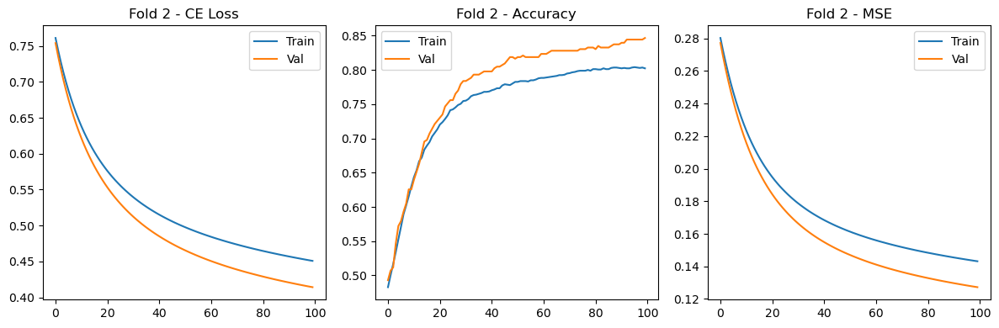


🔁 Fold 3
✅ CE Loss: 0.4736 | Acc: 0.7814 | MSE: 0.1539


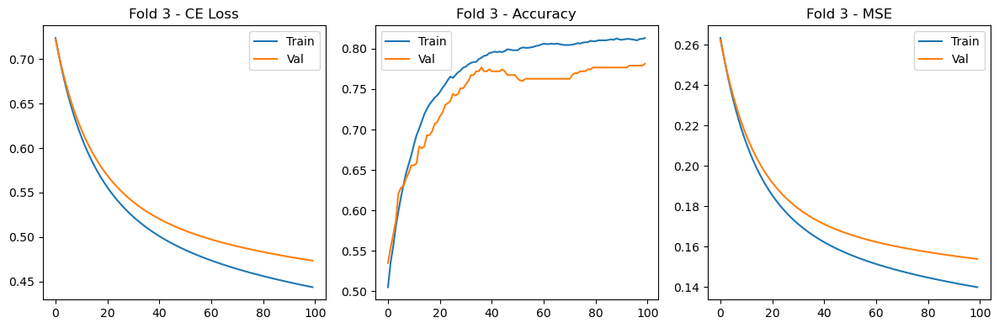


🔁 Fold 4
✅ CE Loss: 0.4718 | Acc: 0.7791 | MSE: 0.1502


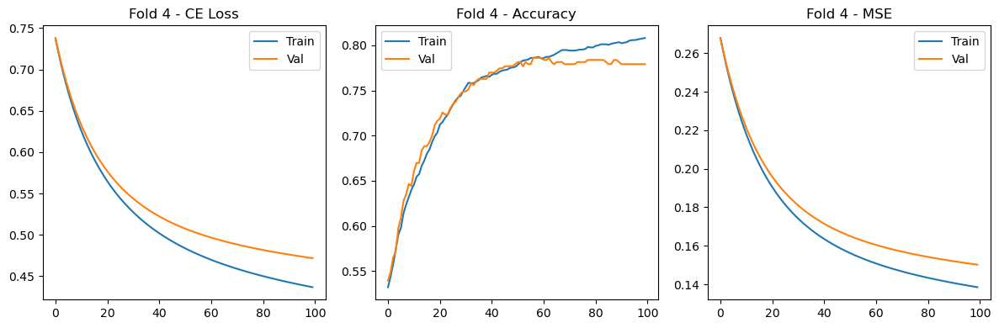


🔁 Fold 5
✅ CE Loss: 0.4858 | Acc: 0.7599 | MSE: 0.1598


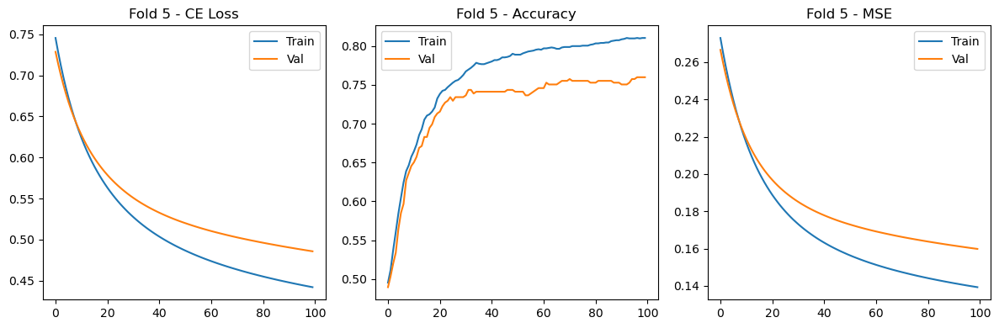

In [105]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.2
)

In [106]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.446141,0.827907,0.140770
1,2,0.414121,0.846512,0.127227
2,3,0.473559,0.781395,0.153924
3,4,0.471816,0.779070,0.150239
4,5,0.485821,0.759907,0.159818


l.rate = 0.001 momentum = 0.6


🔁 Fold 1
✅ CE Loss: 0.4140 | Acc: 0.8395 | MSE: 0.1282


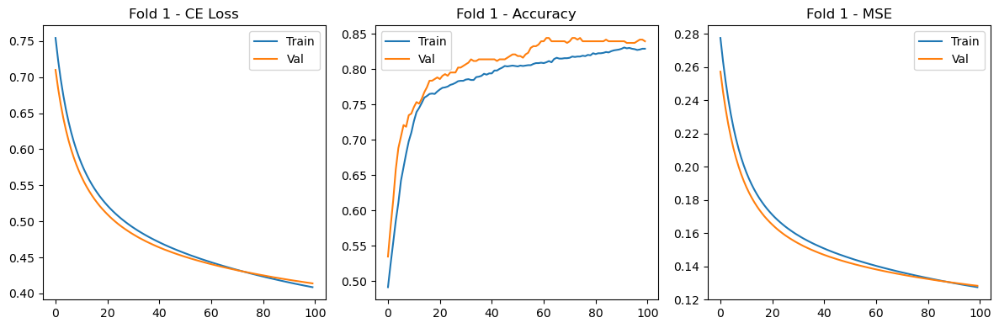


🔁 Fold 2
✅ CE Loss: 0.3818 | Acc: 0.8651 | MSE: 0.1155


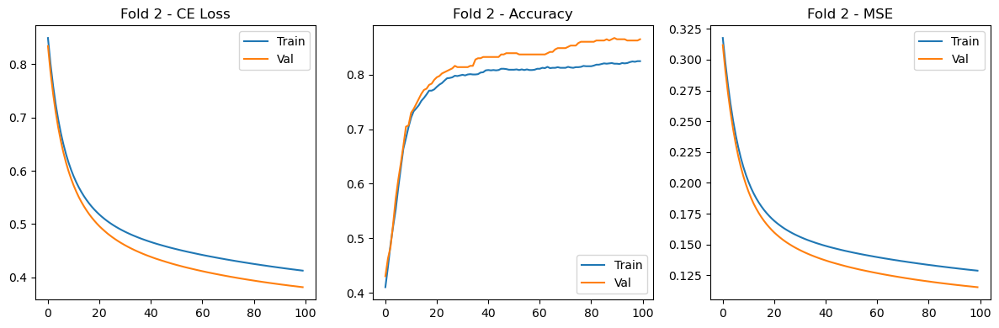


🔁 Fold 3
✅ CE Loss: 0.4283 | Acc: 0.8000 | MSE: 0.1378


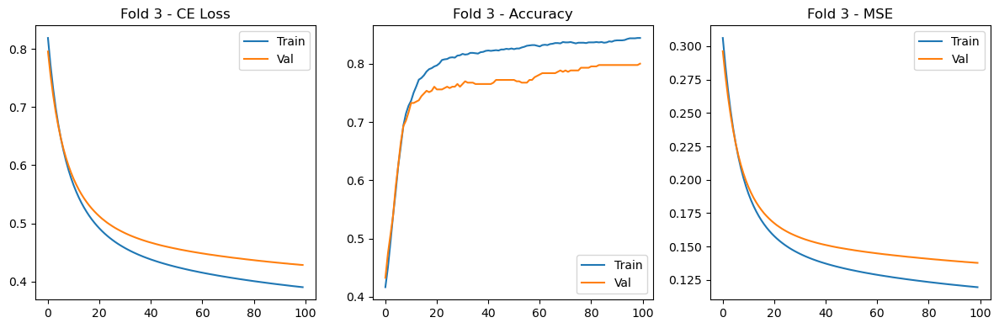


🔁 Fold 4
✅ CE Loss: 0.4426 | Acc: 0.8070 | MSE: 0.1379


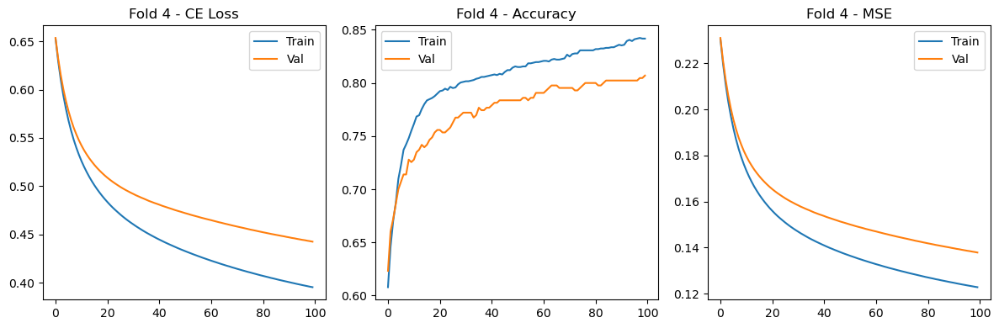


🔁 Fold 5
✅ CE Loss: 0.4454 | Acc: 0.7809 | MSE: 0.1443


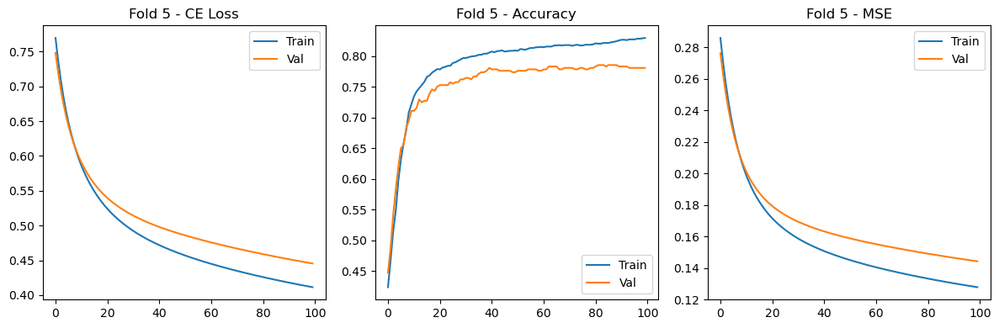

In [107]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6
)

In [108]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.413974,0.839535,0.128219
1,2,0.381847,0.865116,0.115454
2,3,0.428349,0.800000,0.137786
3,4,0.442648,0.806977,0.137896
4,5,0.445440,0.780886,0.144276


l.rate = 0.05 momentum = 0.6


🔁 Fold 1
✅ CE Loss: 0.3712 | Acc: 0.8419 | MSE: 0.1135


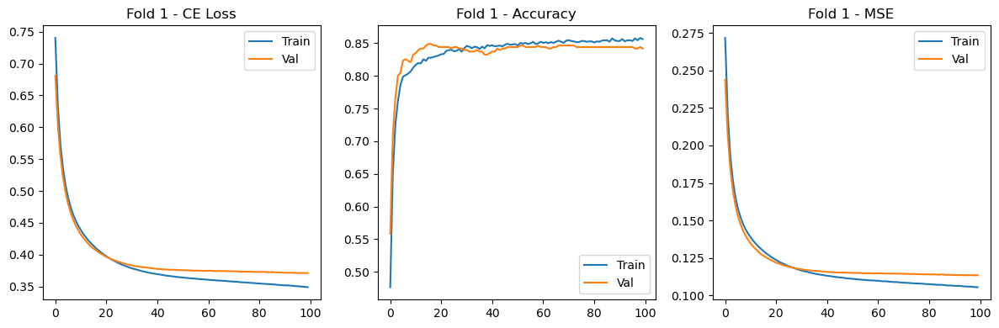


🔁 Fold 2
✅ CE Loss: 0.3327 | Acc: 0.8605 | MSE: 0.1000


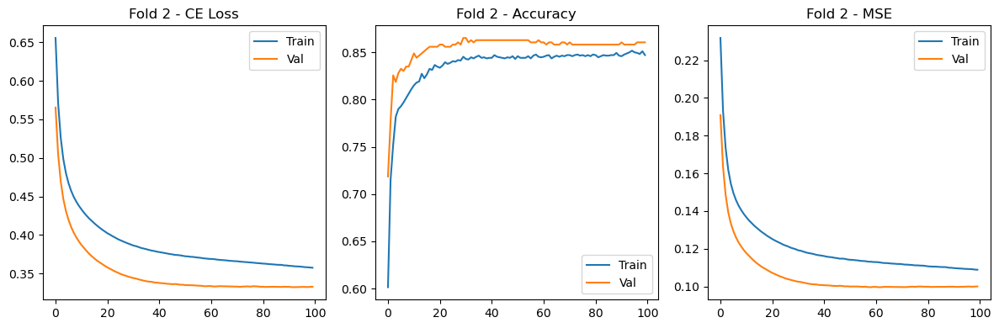


🔁 Fold 3
✅ CE Loss: 0.3954 | Acc: 0.8233 | MSE: 0.1234


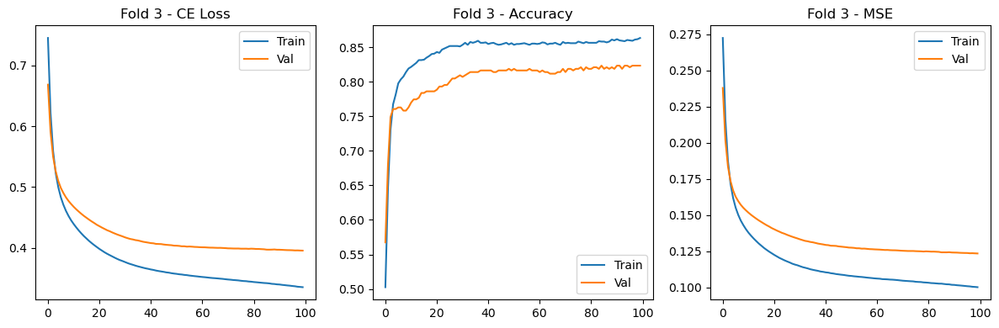


🔁 Fold 4
✅ CE Loss: 0.4120 | Acc: 0.8163 | MSE: 0.1234


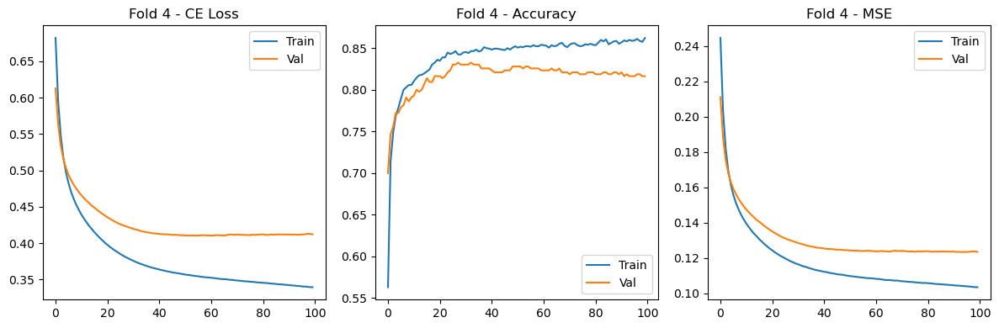


🔁 Fold 5
✅ CE Loss: 0.3886 | Acc: 0.8298 | MSE: 0.1209


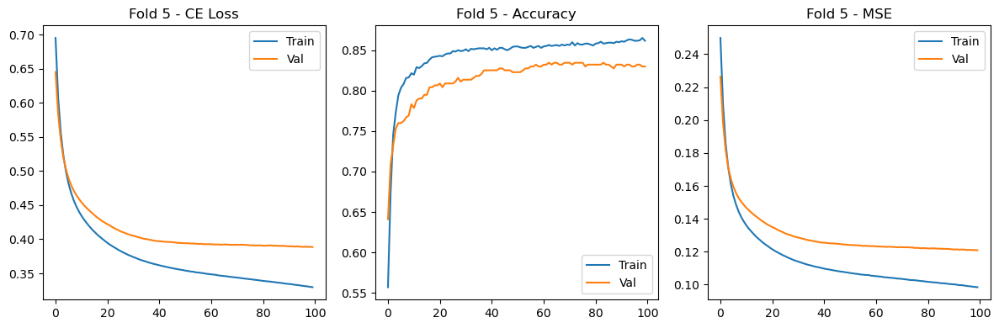

In [109]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.005,
    momentum=0.6
)

In [110]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.371235,0.841860,0.113531
1,2,0.332746,0.860465,0.100000
2,3,0.395393,0.823256,0.123368
3,4,0.411982,0.816279,0.123400
4,5,0.388585,0.829837,0.120907


l.rate = 0.1 momentum = 0.6


🔁 Fold 1
✅ CE Loss: 0.3846 | Acc: 0.8395 | MSE: 0.1166


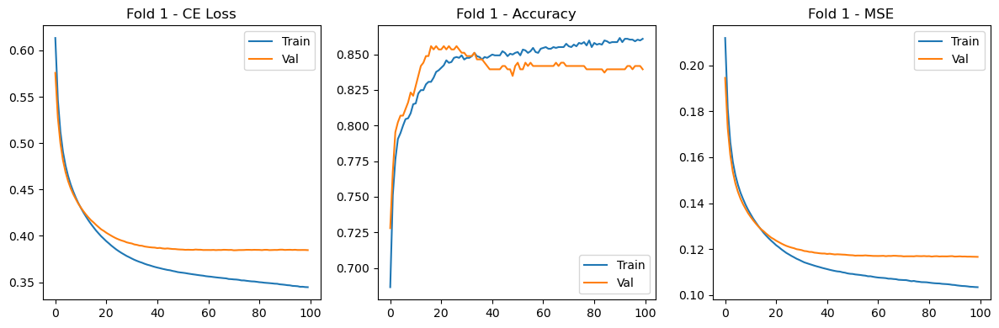


🔁 Fold 2
✅ CE Loss: 0.3358 | Acc: 0.8558 | MSE: 0.1019


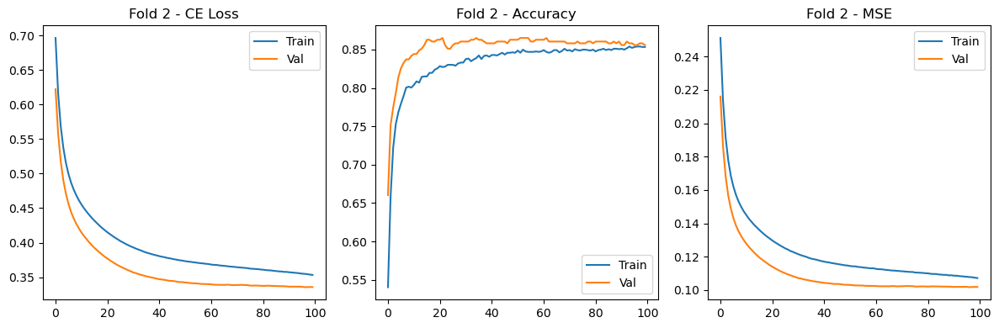


🔁 Fold 3
✅ CE Loss: 0.3996 | Acc: 0.8302 | MSE: 0.1240


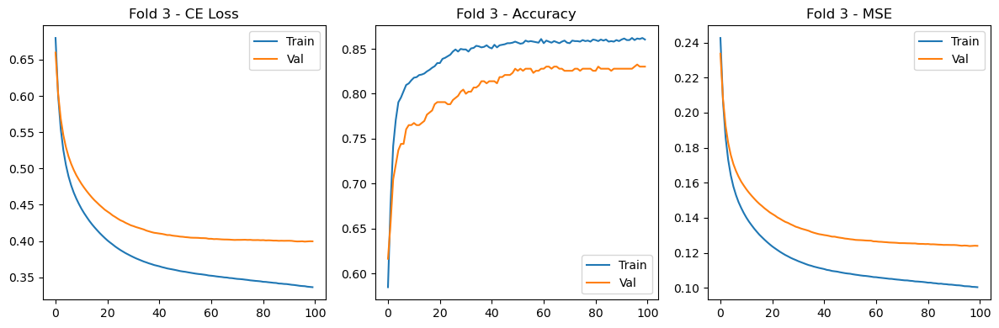


🔁 Fold 4
✅ CE Loss: 0.4112 | Acc: 0.8256 | MSE: 0.1230


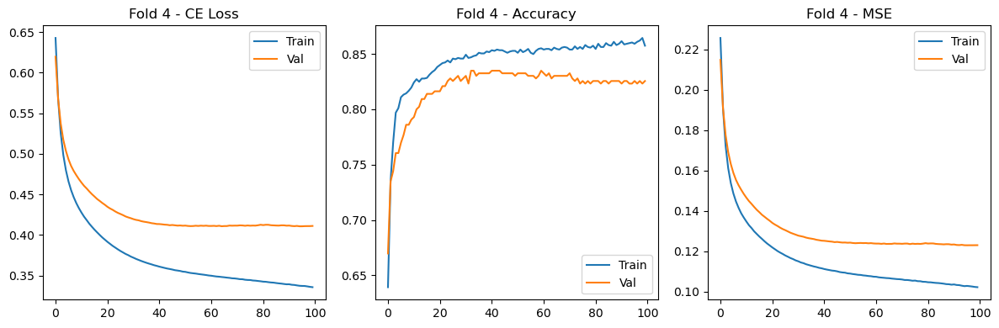


🔁 Fold 5
✅ CE Loss: 0.3925 | Acc: 0.8322 | MSE: 0.1231


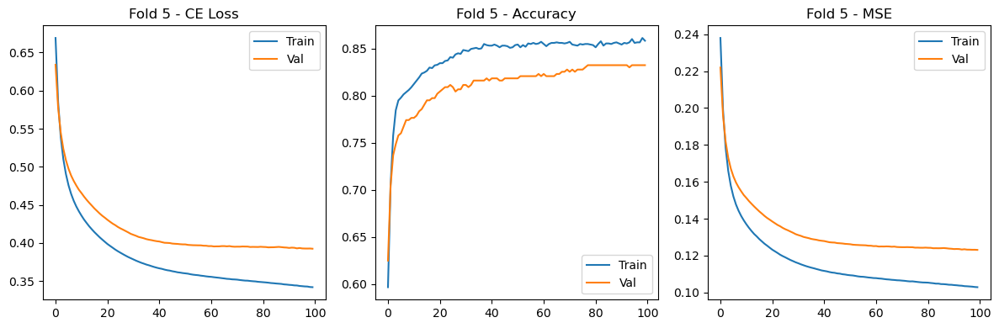

In [111]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.005,
    momentum=0.6
)

In [112]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.384566,0.839535,0.116642
1,2,0.335798,0.855814,0.101859
2,3,0.399591,0.830233,0.123980
3,4,0.411180,0.825581,0.123043
4,5,0.392498,0.832168,0.123115


A3 with avg plots

In [113]:
def plot_average_history(all_histories, metric='loss'):
    max_epochs = max(len(h[metric]) for h in all_histories)
    avg = np.zeros(max_epochs)

    for h in all_histories:
        values = h[metric]
        padded = np.pad(values, (0, max_epochs - len(values)), constant_values=np.nan)
        avg += np.nan_to_num(padded)
    avg /= len(all_histories)

    plt.plot(avg, label=f'Avg {metric}')
    plt.xlabel('Epoch')
    plt.ylabel(metric.capitalize())
    plt.title(f'📈 Average {metric} over {len(all_histories)} folds')
    plt.grid(True)
    plt.legend()
    plt.show()

In [116]:
def run_5fold_cv(X, y, hidden_dim, activation='tanh', epochs=100, batch_size=32, learning_rate=0.001, momentum=0.0):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    fold_metrics = []
    all_histories = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\n🔁 Fold {fold+1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = build_model_with_momentum(
            input_dim=X.shape[1],
            hidden_dim=hidden_dim,
            learning_rate=learning_rate,
            momentum=momentum,
            activation=activation
        )

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=0
        )

        all_histories.append(history.history)

        scores = model.evaluate(X_val, y_val, verbose=0)
        metrics_dict = {
            'Fold': fold+1,
            'CE_Loss': scores[0],
            'Accuracy': scores[1],
            'MSE': scores[2]
        }
        fold_metrics.append(metrics_dict)
        print(f"✅ CE Loss: {scores[0]:.4f} | Acc: {scores[1]:.4f} | MSE: {scores[2]:.4f}")

    
    print("\n Average Curves:")
    plot_average_history(all_histories, metric='loss')
    plot_average_history(all_histories, metric='val_loss')
    plot_average_history(all_histories, metric='accuracy')

    return pd.DataFrame(fold_metrics)


🔁 Fold 1
✅ CE Loss: 0.4571 | Acc: 0.8000 | MSE: 0.1446

🔁 Fold 2
✅ CE Loss: 0.4079 | Acc: 0.8395 | MSE: 0.1258

🔁 Fold 3
✅ CE Loss: 0.4697 | Acc: 0.7698 | MSE: 0.1527

🔁 Fold 4
✅ CE Loss: 0.4816 | Acc: 0.7814 | MSE: 0.1541

🔁 Fold 5
✅ CE Loss: 0.4635 | Acc: 0.7902 | MSE: 0.1503

📊 Μέσες γραφικές παραστάσεις σύγκλισης (Average Learning Curves):


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


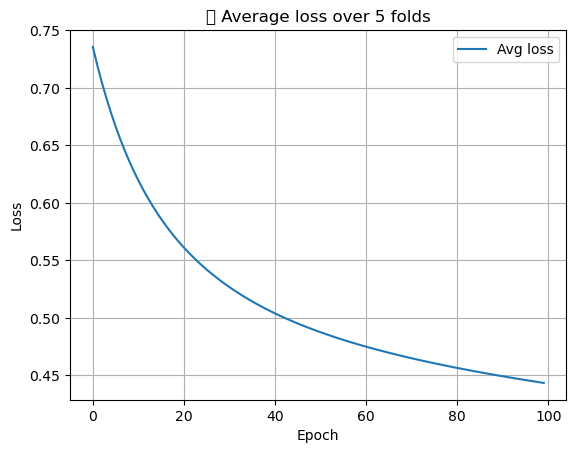

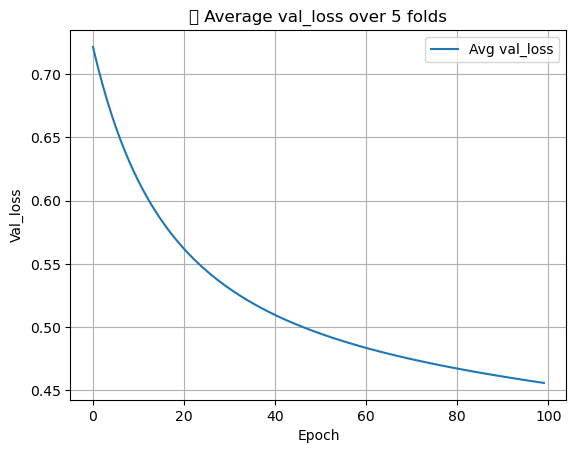

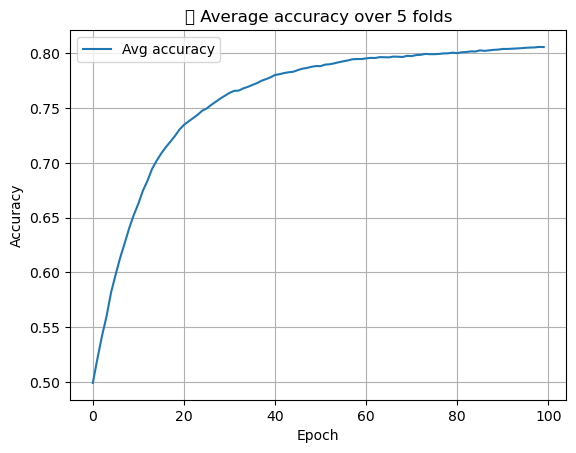

In [115]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.2
)


🔁 Fold 1
✅ CE Loss: 0.4083 | Acc: 0.8419 | MSE: 0.1267

🔁 Fold 2
✅ CE Loss: 0.3815 | Acc: 0.8628 | MSE: 0.1159

🔁 Fold 3
✅ CE Loss: 0.4386 | Acc: 0.7860 | MSE: 0.1418

🔁 Fold 4
✅ CE Loss: 0.4455 | Acc: 0.8023 | MSE: 0.1401

🔁 Fold 5
✅ CE Loss: 0.4309 | Acc: 0.8065 | MSE: 0.1385

 Average Curves:


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


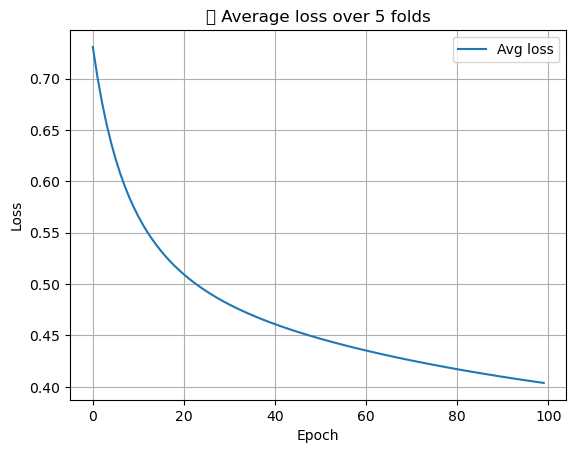

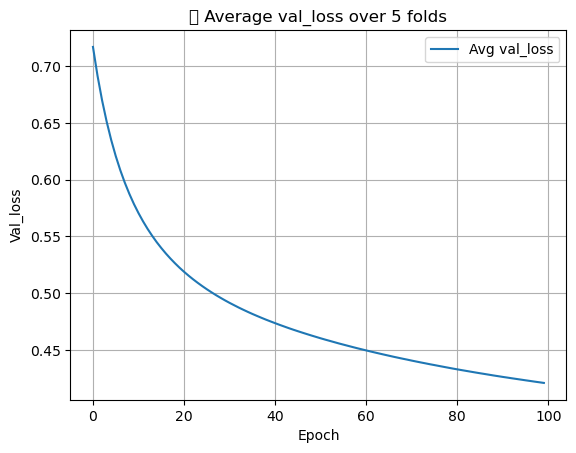

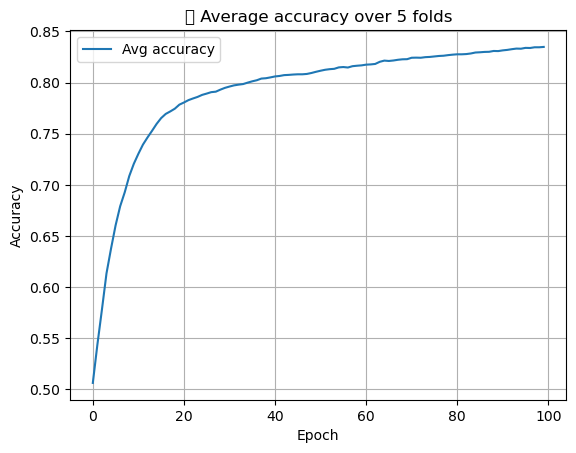

In [117]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6
)


🔁 Fold 1
✅ CE Loss: 0.4903 | Acc: 0.8372 | MSE: 0.1226

🔁 Fold 2
✅ CE Loss: 0.5150 | Acc: 0.8186 | MSE: 0.1366

🔁 Fold 3
✅ CE Loss: 0.5773 | Acc: 0.8093 | MSE: 0.1470

🔁 Fold 4
✅ CE Loss: 0.5483 | Acc: 0.8395 | MSE: 0.1222

🔁 Fold 5
✅ CE Loss: 0.6321 | Acc: 0.8159 | MSE: 0.1477

 Average Curves:


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


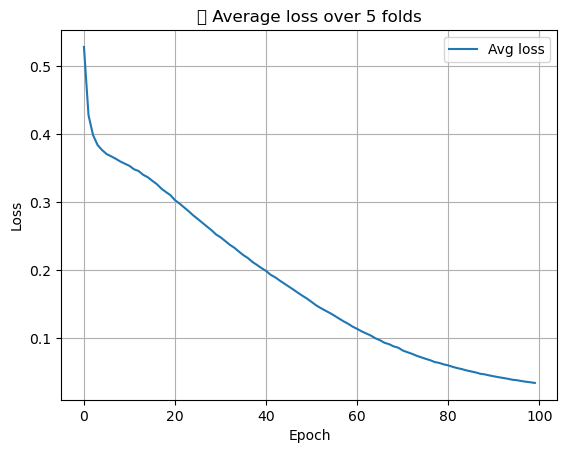

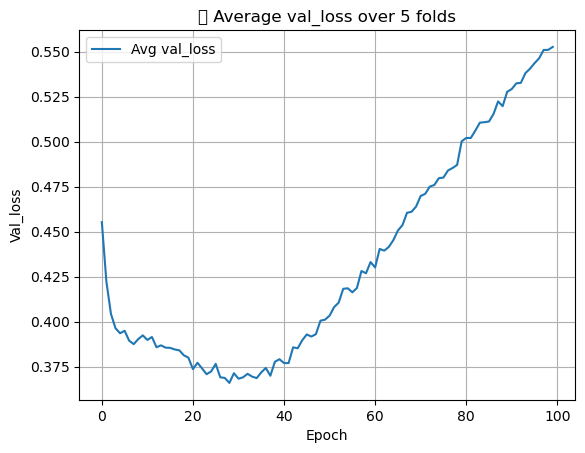

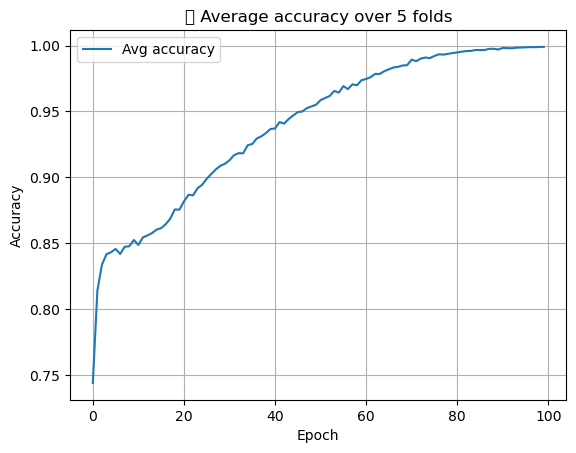

In [118]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.05,
    momentum=0.6
)

In [120]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.490278,0.837209,0.122587
1,2,0.514995,0.818605,0.136629
2,3,0.577277,0.809302,0.147045
3,4,0.548292,0.839535,0.122192
4,5,0.632125,0.815851,0.147684



🔁 Fold 1
✅ CE Loss: 0.6160 | Acc: 0.8140 | MSE: 0.1417

🔁 Fold 2
✅ CE Loss: 0.6009 | Acc: 0.8535 | MSE: 0.1277

🔁 Fold 3
✅ CE Loss: 0.7368 | Acc: 0.8186 | MSE: 0.1495

🔁 Fold 4
✅ CE Loss: 0.6487 | Acc: 0.8512 | MSE: 0.1254

🔁 Fold 5
✅ CE Loss: 0.8036 | Acc: 0.8019 | MSE: 0.1613

 Average Curves:


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


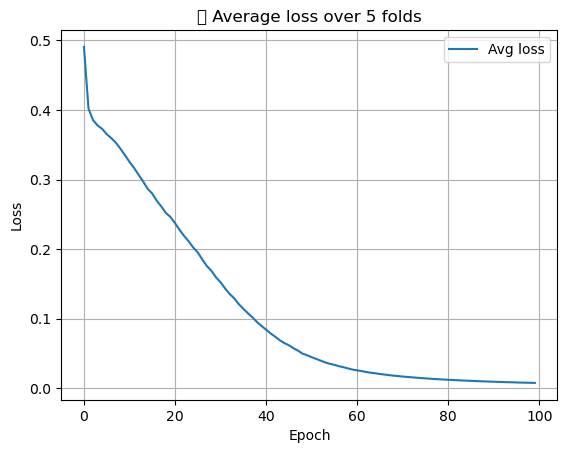

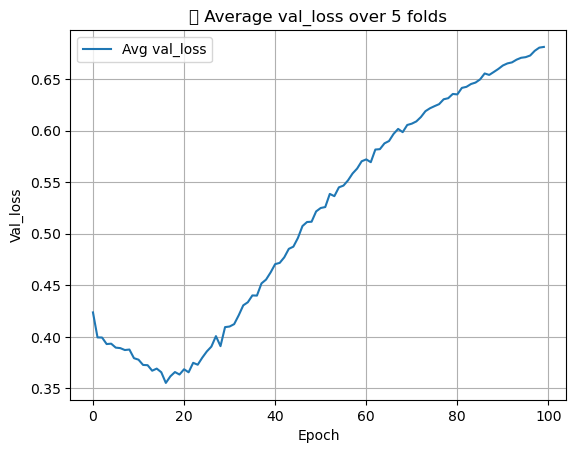

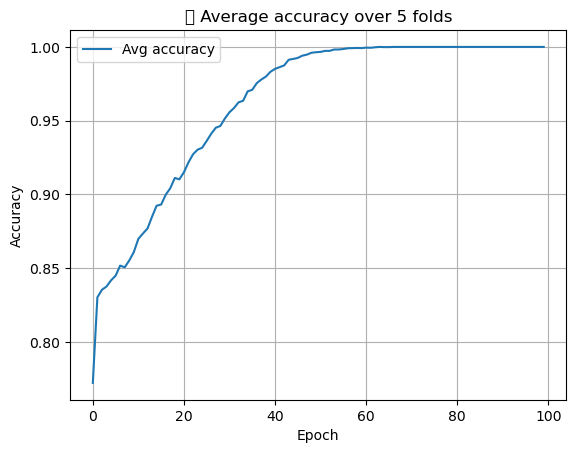

In [121]:
results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.1,
    momentum=0.6
)

In [122]:
results = pd.DataFrame(results_df)
results

,Fold,CE_Loss,Accuracy,MSE
0,1,0.615972,0.813953,0.141715
1,2,0.600946,0.853488,0.127654
2,3,0.736764,0.818605,0.149518
3,4,0.648673,0.851163,0.125394
4,5,0.803641,0.801865,0.161290


A4

In [124]:
def build_model_with_momentum(input_dim, hidden_dim, learning_rate=0.001, momentum=0.0, activation='tanh', regularizer=None):
    model = keras.Sequential([
        layers.Input(shape=(input_dim,)),
        layers.Dense(hidden_dim, activation=activation, kernel_regularizer=regularizer),
        layers.Dense(1, activation='sigmoid')
    ])

    optimizer = keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)

    model.compile(
        optimizer=optimizer,
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.MeanSquaredError()]
    )
    return model


In [125]:
def run_5fold_cv(X, y, hidden_dim, activation='tanh', epochs=100, batch_size=32, learning_rate=0.001, momentum=0.0, regularizer=None):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    fold_metrics = []
    all_histories = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\n🔁 Fold {fold+1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = build_model_with_momentum(
            input_dim=X.shape[1],
            hidden_dim=hidden_dim,
            learning_rate=learning_rate,
            momentum=momentum,
            activation=activation,
            regularizer=regularizer
        )

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=0
        )

        all_histories.append(history.history)

        scores = model.evaluate(X_val, y_val, verbose=0)
        metrics_dict = {
            'Fold': fold+1,
            'CE_Loss': scores[0],
            'Accuracy': scores[1],
            'MSE': scores[2]
        }
        fold_metrics.append(metrics_dict)
        print(f"✅ CE Loss: {scores[0]:.4f} | Acc: {scores[1]:.4f} | MSE: {scores[2]:.4f}")

    
    print("\n Average Learning Curves")
    plot_average_history(all_histories, metric='loss')
    plot_average_history(all_histories, metric='val_loss')
    plot_average_history(all_histories, metric='accuracy')

    return pd.DataFrame(fold_metrics)


🔁 Fold 1
✅ CE Loss: 0.4106 | Acc: 0.8442 | MSE: 0.1255

🔁 Fold 2
✅ CE Loss: 0.3832 | Acc: 0.8488 | MSE: 0.1145

🔁 Fold 3
✅ CE Loss: 0.4317 | Acc: 0.8070 | MSE: 0.1372

🔁 Fold 4
✅ CE Loss: 0.4431 | Acc: 0.8209 | MSE: 0.1369

🔁 Fold 5
✅ CE Loss: 0.4412 | Acc: 0.8159 | MSE: 0.1401

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


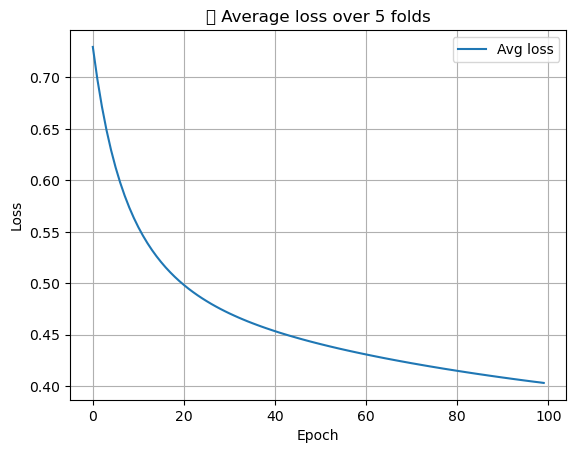

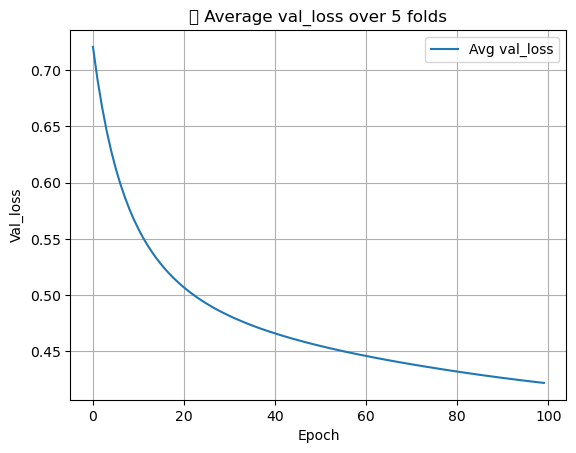

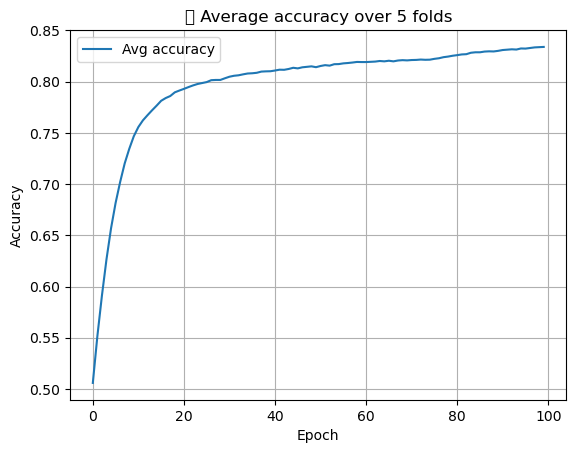

In [126]:
regularizer = regularizers.l2(0.0001)

results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=regularizer
)


🔁 Fold 1
✅ CE Loss: 0.4504 | Acc: 0.8465 | MSE: 0.1259

🔁 Fold 2
✅ CE Loss: 0.4211 | Acc: 0.8581 | MSE: 0.1149

🔁 Fold 3
✅ CE Loss: 0.4754 | Acc: 0.8070 | MSE: 0.1383

🔁 Fold 4
✅ CE Loss: 0.4879 | Acc: 0.8093 | MSE: 0.1385

🔁 Fold 5
✅ CE Loss: 0.4743 | Acc: 0.7995 | MSE: 0.1382

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


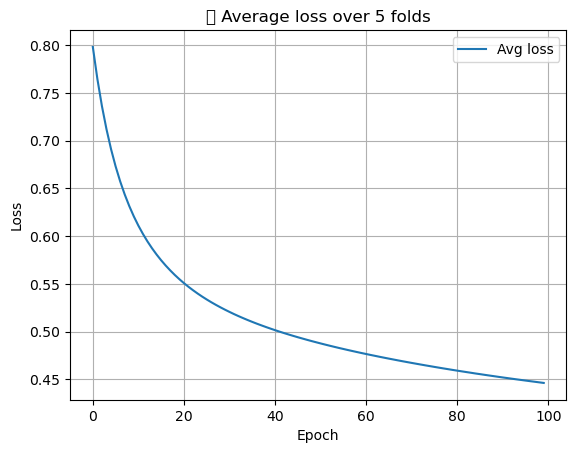

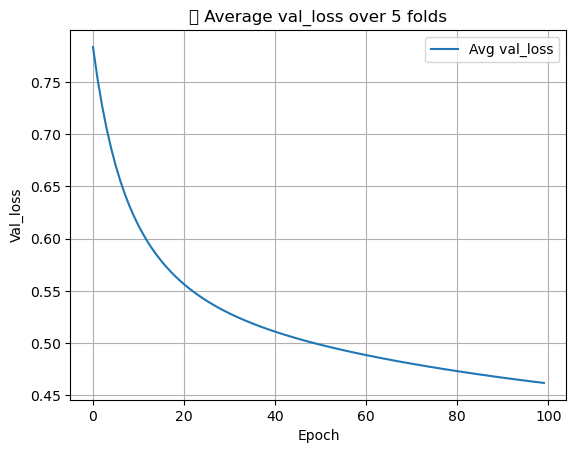

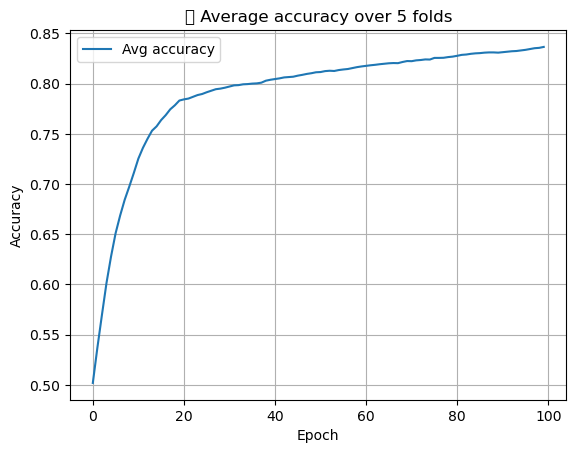

In [127]:
regularizer = regularizers.l2(0.001)

results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=regularizer
)


🔁 Fold 1
✅ CE Loss: 0.6912 | Acc: 0.8512 | MSE: 0.1263

🔁 Fold 2
✅ CE Loss: 0.6454 | Acc: 0.8488 | MSE: 0.1133

🔁 Fold 3
✅ CE Loss: 0.6950 | Acc: 0.8209 | MSE: 0.1365

🔁 Fold 4
✅ CE Loss: 0.7150 | Acc: 0.8070 | MSE: 0.1371

🔁 Fold 5
✅ CE Loss: 0.7098 | Acc: 0.7972 | MSE: 0.1370

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


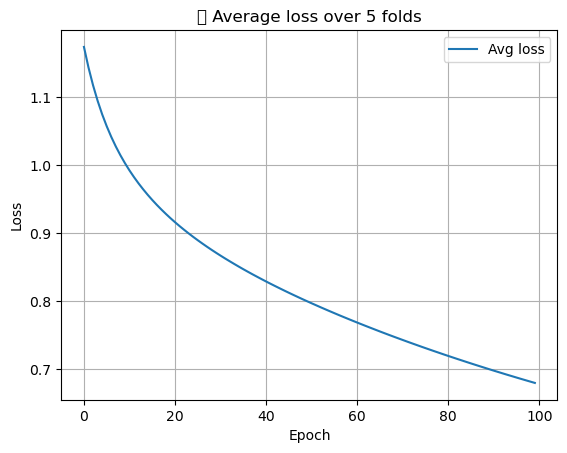

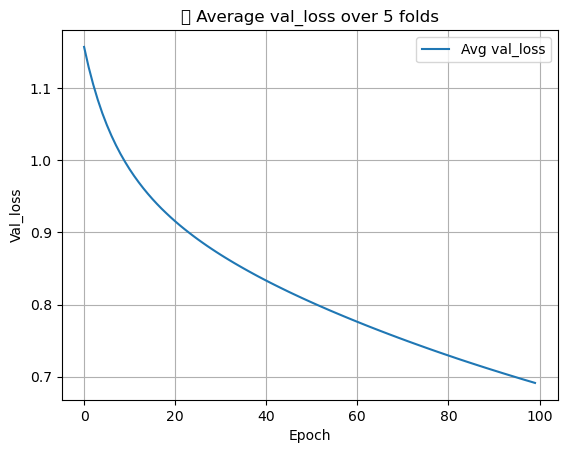

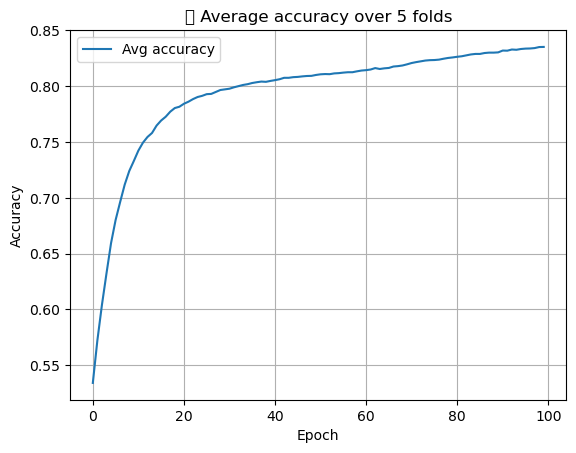

In [128]:
regularizer = regularizers.l2(0.01)

results_df = run_5fold_cv(
    X, y,
    hidden_dim=68,
    activation='tanh',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=regularizer
)

A5

In [129]:
def deep_model(input_dim, layer_dims, learning_rate=0.001, momentum=0.0, activation='relu', dropout_rate=None, regularizer=None):
    model = keras.Sequential()
    model.add(layers.Input(shape=(input_dim,)))

    for i, dim in enumerate(layer_dims):
        model.add(layers.Dense(dim, activation=activation, kernel_regularizer=regularizer))
        if dropout_rate:
            model.add(layers.Dropout(dropout_rate))

    model.add(layers.Dense(1, activation='sigmoid'))

    optimizer = keras.optimizers.SGD(learning_rate=learning_rate, momentum=momentum)

    model.compile(
        optimizer=optimizer,
        loss='binary_crossentropy',
        metrics=['accuracy', keras.metrics.MeanSquaredError()]
    )

    return model

In [134]:
def run_5fold_cv(X, y, hidden_dims, activation='tanh', epochs=100, batch_size=32, learning_rate=0.001, momentum=0.0, regularizer=None):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    fold_metrics = []
    all_histories = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y)):
        print(f"\n🔁 Fold {fold+1}")
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = deep_model(
            input_dim=X.shape[1],
            layer_dims=hidden_dims, 
            learning_rate=learning_rate,
            momentum=momentum,
            activation=activation,
            regularizer=regularizer
)

        history = model.fit(
            X_train, y_train,
            validation_data=(X_val, y_val),
            epochs=epochs,
            batch_size=batch_size,
            verbose=0
        )

        all_histories.append(history.history)

        scores = model.evaluate(X_val, y_val, verbose=0)
        metrics_dict = {
            'Fold': fold+1,
            'CE_Loss': scores[0],
            'Accuracy': scores[1],
            'MSE': scores[2]
        }
        fold_metrics.append(metrics_dict)
        print(f"✅ CE Loss: {scores[0]:.4f} | Acc: {scores[1]:.4f} | MSE: {scores[2]:.4f}")

    
    print("\n Average Learning Curves")
    plot_average_history(all_histories, metric='loss')
    plot_average_history(all_histories, metric='val_loss')
    plot_average_history(all_histories, metric='accuracy')

    return pd.DataFrame(fold_metrics)

Hidden Layer Structure = [68, 68]


🔁 Fold 1
✅ CE Loss: 0.4283 | Acc: 0.8186 | MSE: 0.1337

🔁 Fold 2
✅ CE Loss: 0.3891 | Acc: 0.8488 | MSE: 0.1181

🔁 Fold 3
✅ CE Loss: 0.4280 | Acc: 0.7860 | MSE: 0.1381

🔁 Fold 4
✅ CE Loss: 0.4241 | Acc: 0.8372 | MSE: 0.1304

🔁 Fold 5
✅ CE Loss: 0.4667 | Acc: 0.7809 | MSE: 0.1499

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


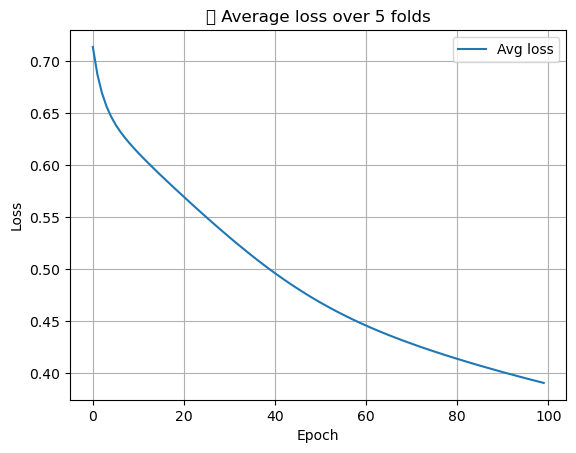

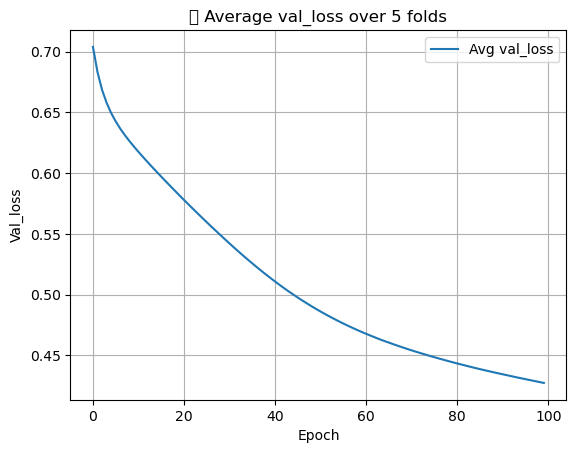

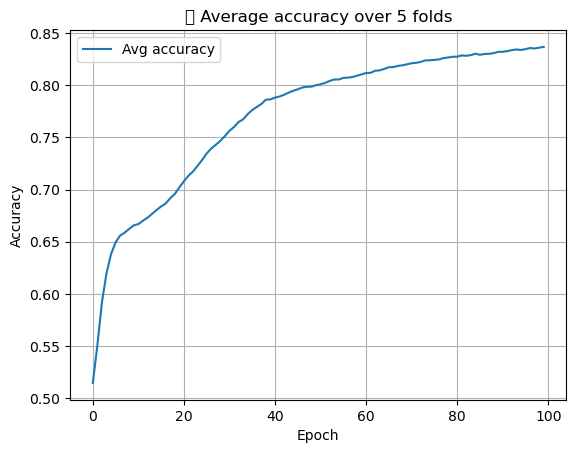

In [135]:
results_df = run_5fold_cv(
    X, y,  
    hidden_dims=[68, 68],  
    activation='relu',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=None
)

Hidden Layer Structure = [128, 64, 32]


🔁 Fold 1
✅ CE Loss: 0.3763 | Acc: 0.8326 | MSE: 0.1168

🔁 Fold 2
✅ CE Loss: 0.3623 | Acc: 0.8558 | MSE: 0.1082

🔁 Fold 3
✅ CE Loss: 0.4227 | Acc: 0.8070 | MSE: 0.1355

🔁 Fold 4
✅ CE Loss: 0.4224 | Acc: 0.8163 | MSE: 0.1292

🔁 Fold 5
✅ CE Loss: 0.4527 | Acc: 0.7692 | MSE: 0.1491

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


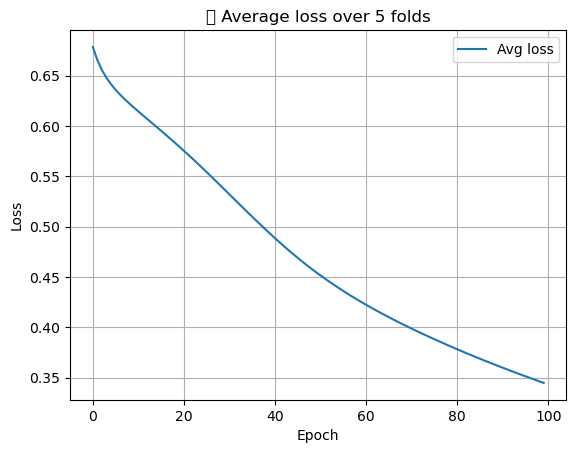

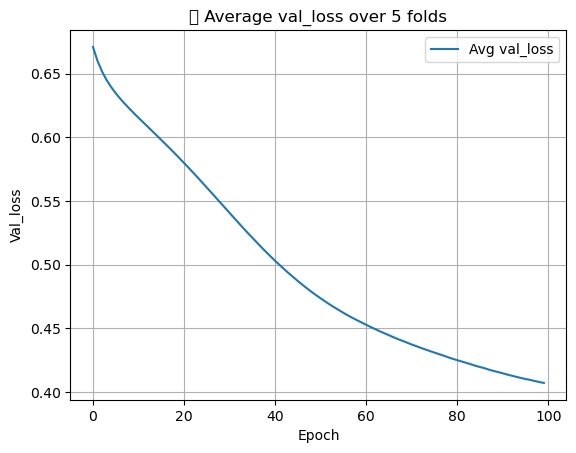

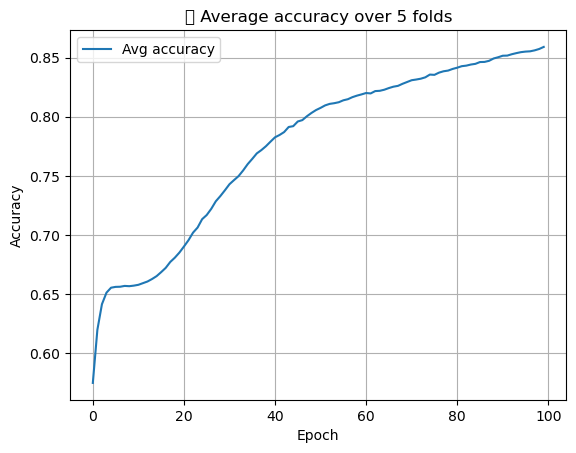

In [137]:
results_df = run_5fold_cv(
    X, y,  
    hidden_dims=[128, 64, 32],  
    activation='relu',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=None
)

Hidden Layer Structure = [32, 64, 128]


🔁 Fold 1
✅ CE Loss: 0.4325 | Acc: 0.8186 | MSE: 0.1370

🔁 Fold 2
✅ CE Loss: 0.3979 | Acc: 0.8256 | MSE: 0.1231

🔁 Fold 3
✅ CE Loss: 0.4570 | Acc: 0.7767 | MSE: 0.1480

🔁 Fold 4
✅ CE Loss: 0.4605 | Acc: 0.7837 | MSE: 0.1486

🔁 Fold 5
✅ CE Loss: 0.4611 | Acc: 0.7832 | MSE: 0.1508

 Average Learning Curves


D:\anaconda3\envs\ml-env\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


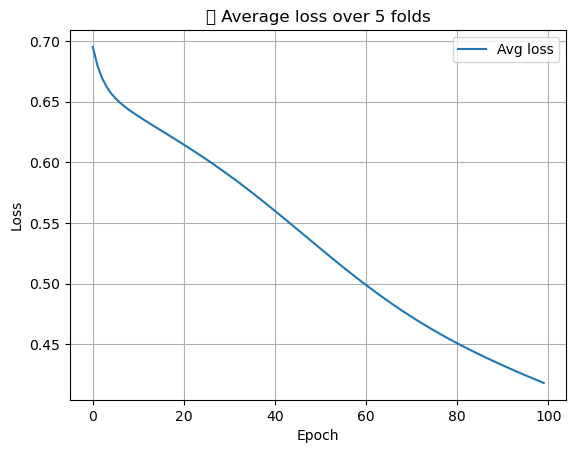

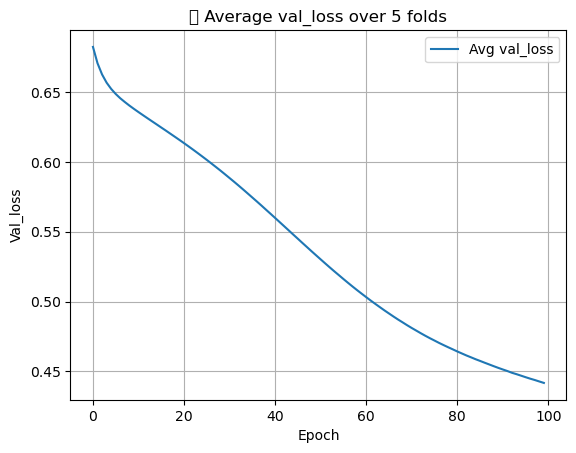

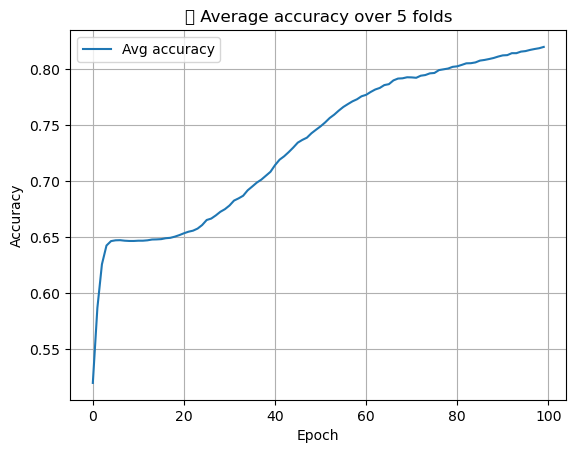

In [139]:
results_df = run_5fold_cv(
    X, y,  
    hidden_dims=[32, 64, 128],  
    activation='relu',
    epochs=100,
    learning_rate=0.001,
    momentum=0.6,
    regularizer=None
)